# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

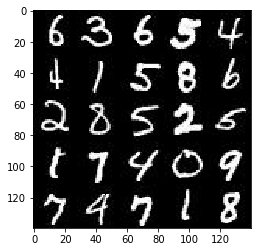

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

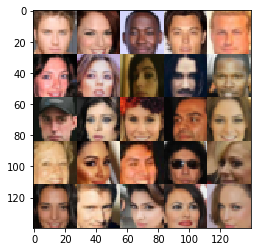

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    
    input_real = tf.placeholder(tf.float32,[None,image_width,image_height,image_channels])
    input_z = tf.placeholder(tf.float32,[None,z_dim])
    
    learning_rate = tf.placeholder(tf.float32)

    return input_real, input_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def lrelu(x, leak=0.2, name="lrelu"):
     with tf.name_scope(name):
         f1 = 0.5 * (1 + leak)
         f2 = 0.5 * (1 - leak)
         return f1 * x + f2 * abs(x)

In [7]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    import numpy as np
    
    with tf.variable_scope('discriminator',reuse=reuse):
        conv1 = tf.layers.conv2d(images,filters=128,kernel_size=5,padding='same',use_bias=True,kernel_initializer=tf.contrib.layers.xavier_initializer())   #output dim = 28x28x128
        conv1 = lrelu(conv1)  
    
        conv2 = tf.layers.conv2d(conv1,filters=256,kernel_size=5, strides=2,padding='same',use_bias=False,kernel_initializer=tf.contrib.layers.xavier_initializer())  #14x14x256
        conv2 = tf.layers.batch_normalization(conv2,training=True)
        conv2 = lrelu(conv2) 
        
        #conv3 = tf.layers.conv2d(conv2,filters=256,kernel_size=5,padding='same',use_bias=False,kernel_initializer=tf.contrib.layers.xavier_initializer())   
        #conv3 = tf.layers.batch_normalization(conv3,training=True)
        #conv3 = lrelu(conv3)
        
        conv4 = tf.layers.conv2d(conv2,filters=512,kernel_size=5, strides=2, padding='same',use_bias=False,kernel_initializer=tf.contrib.layers.xavier_initializer())  #7x7x512
        conv4 = tf.layers.batch_normalization(conv4,training=True)
        conv4 = lrelu(conv4)
        
        features = tf.reshape(conv4,[-1,np.prod(conv4.shape.as_list()[1:])])
        logits = tf.layers.dense(features,units=1,kernel_initializer=tf.contrib.layers.xavier_initializer())
        out = tf.nn.sigmoid(logits)

    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [21]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    reuse = not is_train
    
    with tf.variable_scope('generator',reuse=reuse):
        fc = tf.layers.dense(z,7*7*1024,activation=None,use_bias=False,kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn = tf.layers.batch_normalization(fc,training=is_train)
        logits = lrelu(bn) 
        reshaped = tf.reshape(logits,[-1,7,7,1024])
        
        conv1 = tf.layers.conv2d_transpose(reshaped,filters=512,kernel_size=5,padding='same',use_bias=False,kernel_initializer=tf.contrib.layers.xavier_initializer())  #output: 7x7x512
        conv1 = tf.layers.batch_normalization(conv1,training=is_train)
        conv1 = lrelu(conv1) 
        #conv1 = tf.layers.dropout(conv1,rate=0.3)  #keep prob = 0.7
        
        #resize1 = tf.image.resize_nearest_neighbor(conv1, [14,14])
        resize1 = tf.layers.conv2d_transpose(conv1,filters=512,kernel_size=5, strides=2, padding='same',use_bias=False,kernel_initializer=tf.contrib.layers.xavier_initializer())  #14x14x512
        resize1 = tf.layers.batch_normalization(resize1,training=is_train)
        resize1 = lrelu(resize1)
        
        conv2 = tf.layers.conv2d_transpose(resize1,filters=256,kernel_size=5,padding='same',use_bias=False,kernel_initializer=tf.contrib.layers.xavier_initializer())  #14x14x256   
        conv2 = tf.layers.batch_normalization(conv2,training=is_train)
        conv2 = lrelu(conv2) 
        #conv2 = tf.layers.dropout(conv2,rate=0.3)  #keep prob = 0.7
        
        #resize2 = tf.image.resize_nearest_neighbor(conv2, [28,28])
        resize2 = tf.layers.conv2d_transpose(conv2,filters=256,kernel_size=5, strides=2, padding='same',use_bias=False,kernel_initializer=tf.contrib.layers.xavier_initializer())  #28x28x256
        resize2 = tf.layers.batch_normalization(resize2,training=is_train)
        resize2 = lrelu(resize2)
        
        conv3 = tf.layers.conv2d_transpose(resize2,filters=128,kernel_size=5,padding='same',use_bias=False,kernel_initializer=tf.contrib.layers.xavier_initializer())   #28x28x128
        conv3 = tf.layers.batch_normalization(conv3,training=is_train)
        conv3 = lrelu(conv3)  
        conv3 = tf.layers.dropout(conv3,rate=0.3)  #keep prob = 0.7
        
        
        out = tf.layers.conv2d_transpose(conv3,filters=out_channel_dim,kernel_size=5,padding='same',activation=tf.nn.tanh,use_bias=True,kernel_initializer=tf.contrib.layers.xavier_initializer())
        
    return out 

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [22]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    
    import numpy as np
    smoothing_factor = np.random.uniform(0.7, 1.0)
    
    d_out_real, d_logits_real = discriminator(input_real, reuse=False)
    d_labels_real = tf.ones_like(d_out_real) * smoothing_factor
    d_cost_real = tf.nn.sigmoid_cross_entropy_with_logits(labels=d_labels_real, logits=d_logits_real)
    d_loss_real = tf.reduce_mean(d_cost_real)
    
    g_out = generator(input_z, out_channel_dim, is_train=True)
    d_out_fake, d_logits_fake = discriminator(g_out, reuse=True)
    
    d_labels_fake = tf.zeros_like(d_out_fake)
    d_cost_fake = tf.nn.sigmoid_cross_entropy_with_logits(labels=d_labels_fake, logits=d_logits_fake)
    d_loss_fake = tf.reduce_mean(d_cost_fake)
    
    d_loss = d_loss_real + d_loss_fake
    
    g_labels = tf.ones_like(d_logits_fake)
    g_cost = tf.nn.sigmoid_cross_entropy_with_logits(labels=g_labels, logits=d_logits_fake)
    g_loss = tf.reduce_mean(g_cost)
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [23]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    tvars = tf.trainable_variables()
    d_vars = [var for var in tvars if var.name.startswith('discriminator')]
    g_vars = [var for var in tvars if var.name.startswith('generator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    return d_opt, g_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [24]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [25]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    print_every = 10
    show_every = 100
    
    tf.reset_default_graph()
    
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            iteration=0
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                batch_images = 2*batch_images #to scale from [-0.5,0.5] to [-1,1]
                iteration = iteration + 1
                z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                _, train_loss_d = sess.run([d_opt, d_loss], feed_dict={input_real:batch_images, input_z: z, lr:learning_rate})
                _, train_loss_g = sess.run([g_opt, g_loss], feed_dict={input_real:batch_images, input_z: z, lr:learning_rate})
                
                if iteration%print_every==0:
                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "iteration {}...".format(iteration),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                if iteration%show_every==0:
                    show_generator_output(sess, n_images=25, input_z=input_z, out_channel_dim=data_shape[3], image_mode=data_image_mode)
        
        #Samples at the end of training
        show_generator_output(sess, n_images=25, input_z=input_z, out_channel_dim=data_shape[3], image_mode=data_image_mode)



### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... iteration 10... Discriminator Loss: 2.1911... Generator Loss: 24.6288
Epoch 1/2... iteration 20... Discriminator Loss: 2.1711... Generator Loss: 17.9054
Epoch 1/2... iteration 30... Discriminator Loss: 1.0403... Generator Loss: 3.2528
Epoch 1/2... iteration 40... Discriminator Loss: 2.0953... Generator Loss: 2.6299
Epoch 1/2... iteration 50... Discriminator Loss: 1.6364... Generator Loss: 1.1437
Epoch 1/2... iteration 60... Discriminator Loss: 2.2937... Generator Loss: 0.8250
Epoch 1/2... iteration 70... Discriminator Loss: 2.0392... Generator Loss: 0.9439
Epoch 1/2... iteration 80... Discriminator Loss: 1.6572... Generator Loss: 1.0204
Epoch 1/2... iteration 90... Discriminator Loss: 1.5833... Generator Loss: 1.0021
Epoch 1/2... iteration 100... Discriminator Loss: 1.4187... Generator Loss: 1.1400


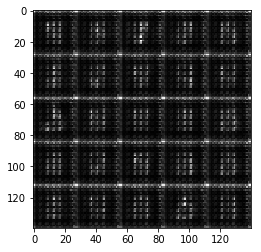

Epoch 1/2... iteration 110... Discriminator Loss: 1.4056... Generator Loss: 0.8719
Epoch 1/2... iteration 120... Discriminator Loss: 1.5276... Generator Loss: 0.7558
Epoch 1/2... iteration 130... Discriminator Loss: 1.6474... Generator Loss: 0.7243
Epoch 1/2... iteration 140... Discriminator Loss: 1.4559... Generator Loss: 0.7125
Epoch 1/2... iteration 150... Discriminator Loss: 1.4721... Generator Loss: 0.8272
Epoch 1/2... iteration 160... Discriminator Loss: 1.4568... Generator Loss: 0.7538
Epoch 1/2... iteration 170... Discriminator Loss: 1.5483... Generator Loss: 0.6841
Epoch 1/2... iteration 180... Discriminator Loss: 1.4756... Generator Loss: 0.7079
Epoch 1/2... iteration 190... Discriminator Loss: 1.5174... Generator Loss: 0.6908
Epoch 1/2... iteration 200... Discriminator Loss: 1.5217... Generator Loss: 0.6555


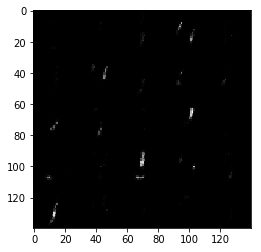

Epoch 1/2... iteration 210... Discriminator Loss: 1.4843... Generator Loss: 0.6813
Epoch 1/2... iteration 220... Discriminator Loss: 1.5132... Generator Loss: 0.6417
Epoch 1/2... iteration 230... Discriminator Loss: 1.4661... Generator Loss: 0.7126
Epoch 1/2... iteration 240... Discriminator Loss: 1.4236... Generator Loss: 0.7278
Epoch 1/2... iteration 250... Discriminator Loss: 1.4936... Generator Loss: 0.6941
Epoch 1/2... iteration 260... Discriminator Loss: 1.4507... Generator Loss: 0.7360
Epoch 1/2... iteration 270... Discriminator Loss: 1.5106... Generator Loss: 0.6757
Epoch 1/2... iteration 280... Discriminator Loss: 1.4566... Generator Loss: 0.7720
Epoch 1/2... iteration 290... Discriminator Loss: 1.4100... Generator Loss: 0.7434
Epoch 1/2... iteration 300... Discriminator Loss: 1.5526... Generator Loss: 0.6933


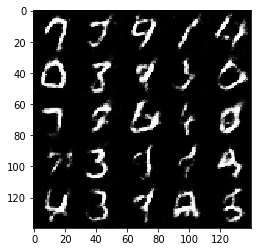

Epoch 1/2... iteration 310... Discriminator Loss: 1.4696... Generator Loss: 0.6890
Epoch 1/2... iteration 320... Discriminator Loss: 1.4595... Generator Loss: 0.7002
Epoch 1/2... iteration 330... Discriminator Loss: 1.6248... Generator Loss: 0.6100
Epoch 1/2... iteration 340... Discriminator Loss: 1.3917... Generator Loss: 0.7953
Epoch 1/2... iteration 350... Discriminator Loss: 1.4558... Generator Loss: 0.6865
Epoch 1/2... iteration 360... Discriminator Loss: 1.3406... Generator Loss: 0.8364
Epoch 1/2... iteration 370... Discriminator Loss: 1.5993... Generator Loss: 0.6925
Epoch 1/2... iteration 380... Discriminator Loss: 1.4230... Generator Loss: 0.8493
Epoch 1/2... iteration 390... Discriminator Loss: 1.4315... Generator Loss: 0.7565
Epoch 1/2... iteration 400... Discriminator Loss: 1.4949... Generator Loss: 0.7489


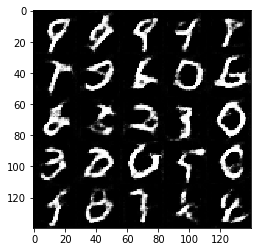

Epoch 1/2... iteration 410... Discriminator Loss: 1.5585... Generator Loss: 0.6280
Epoch 1/2... iteration 420... Discriminator Loss: 1.3500... Generator Loss: 0.8369
Epoch 1/2... iteration 430... Discriminator Loss: 1.3753... Generator Loss: 0.7777
Epoch 1/2... iteration 440... Discriminator Loss: 1.5138... Generator Loss: 0.6997
Epoch 1/2... iteration 450... Discriminator Loss: 1.5240... Generator Loss: 0.6285
Epoch 1/2... iteration 460... Discriminator Loss: 1.3850... Generator Loss: 0.7889
Epoch 2/2... iteration 10... Discriminator Loss: 1.4412... Generator Loss: 0.6941
Epoch 2/2... iteration 20... Discriminator Loss: 1.4638... Generator Loss: 0.6744
Epoch 2/2... iteration 30... Discriminator Loss: 1.4481... Generator Loss: 0.7131
Epoch 2/2... iteration 40... Discriminator Loss: 1.3811... Generator Loss: 0.8269
Epoch 2/2... iteration 50... Discriminator Loss: 1.3705... Generator Loss: 0.7330
Epoch 2/2... iteration 60... Discriminator Loss: 1.4400... Generator Loss: 0.7364
Epoch 2/2.

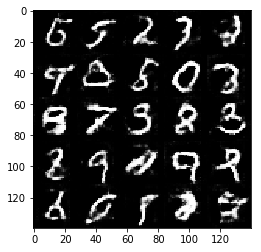

Epoch 2/2... iteration 110... Discriminator Loss: 1.4121... Generator Loss: 0.7395
Epoch 2/2... iteration 120... Discriminator Loss: 1.5405... Generator Loss: 0.6353
Epoch 2/2... iteration 130... Discriminator Loss: 1.4193... Generator Loss: 0.7191
Epoch 2/2... iteration 140... Discriminator Loss: 1.5353... Generator Loss: 0.6931
Epoch 2/2... iteration 150... Discriminator Loss: 1.4200... Generator Loss: 0.7847
Epoch 2/2... iteration 160... Discriminator Loss: 1.4726... Generator Loss: 0.6574
Epoch 2/2... iteration 170... Discriminator Loss: 1.5500... Generator Loss: 0.6742
Epoch 2/2... iteration 180... Discriminator Loss: 1.4176... Generator Loss: 0.7508
Epoch 2/2... iteration 190... Discriminator Loss: 1.4449... Generator Loss: 0.7179
Epoch 2/2... iteration 200... Discriminator Loss: 1.4605... Generator Loss: 0.7347


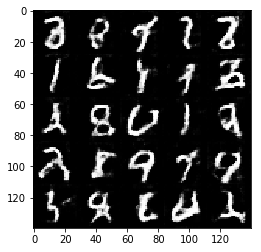

Epoch 2/2... iteration 210... Discriminator Loss: 1.3818... Generator Loss: 0.7827
Epoch 2/2... iteration 220... Discriminator Loss: 1.4725... Generator Loss: 0.7294
Epoch 2/2... iteration 230... Discriminator Loss: 1.4511... Generator Loss: 0.7351
Epoch 2/2... iteration 240... Discriminator Loss: 1.3995... Generator Loss: 0.7517
Epoch 2/2... iteration 250... Discriminator Loss: 1.4447... Generator Loss: 0.7290
Epoch 2/2... iteration 260... Discriminator Loss: 1.4018... Generator Loss: 0.7471
Epoch 2/2... iteration 270... Discriminator Loss: 1.5160... Generator Loss: 0.7203
Epoch 2/2... iteration 280... Discriminator Loss: 1.3793... Generator Loss: 0.7548
Epoch 2/2... iteration 290... Discriminator Loss: 1.4685... Generator Loss: 0.7729
Epoch 2/2... iteration 300... Discriminator Loss: 1.4203... Generator Loss: 0.7698


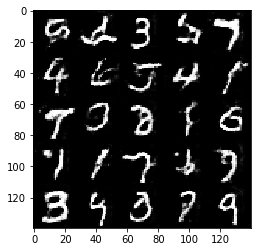

Epoch 2/2... iteration 310... Discriminator Loss: 1.3859... Generator Loss: 0.7287
Epoch 2/2... iteration 320... Discriminator Loss: 1.3769... Generator Loss: 0.7708
Epoch 2/2... iteration 330... Discriminator Loss: 1.4176... Generator Loss: 0.7822
Epoch 2/2... iteration 340... Discriminator Loss: 1.3208... Generator Loss: 0.8898
Epoch 2/2... iteration 350... Discriminator Loss: 1.4578... Generator Loss: 0.5686
Epoch 2/2... iteration 360... Discriminator Loss: 1.4054... Generator Loss: 0.8118
Epoch 2/2... iteration 370... Discriminator Loss: 1.6113... Generator Loss: 0.5959
Epoch 2/2... iteration 380... Discriminator Loss: 1.4642... Generator Loss: 0.7440
Epoch 2/2... iteration 390... Discriminator Loss: 1.3984... Generator Loss: 0.8484
Epoch 2/2... iteration 400... Discriminator Loss: 1.4244... Generator Loss: 0.8073


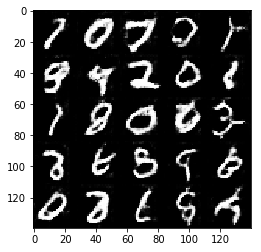

Epoch 2/2... iteration 410... Discriminator Loss: 1.4685... Generator Loss: 0.6543
Epoch 2/2... iteration 420... Discriminator Loss: 1.4289... Generator Loss: 0.7554
Epoch 2/2... iteration 430... Discriminator Loss: 1.3370... Generator Loss: 0.8648
Epoch 2/2... iteration 440... Discriminator Loss: 1.5742... Generator Loss: 0.6307
Epoch 2/2... iteration 450... Discriminator Loss: 1.4718... Generator Loss: 0.6672
Epoch 2/2... iteration 460... Discriminator Loss: 1.3630... Generator Loss: 0.8088


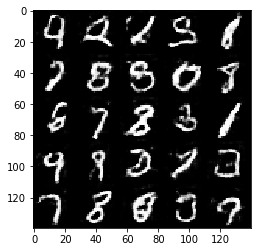

In [28]:
batch_size = 128
z_dim = 100
learning_rate = 0.0002
beta1 = 0.2


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/2... iteration 10... Discriminator Loss: 0.4574... Generator Loss: 8.2936
Epoch 1/2... iteration 20... Discriminator Loss: 4.2667... Generator Loss: 14.9990
Epoch 1/2... iteration 30... Discriminator Loss: 3.0200... Generator Loss: 2.4634
Epoch 1/2... iteration 40... Discriminator Loss: 0.8064... Generator Loss: 2.8657
Epoch 1/2... iteration 50... Discriminator Loss: 2.4780... Generator Loss: 6.7165
Epoch 1/2... iteration 60... Discriminator Loss: 1.3225... Generator Loss: 8.2165
Epoch 1/2... iteration 70... Discriminator Loss: 0.3680... Generator Loss: 3.4242
Epoch 1/2... iteration 80... Discriminator Loss: 1.6595... Generator Loss: 6.0141
Epoch 1/2... iteration 90... Discriminator Loss: 1.8142... Generator Loss: 6.7765
Epoch 1/2... iteration 100... Discriminator Loss: 2.1310... Generator Loss: 1.6408


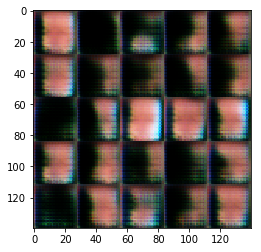

Epoch 1/2... iteration 110... Discriminator Loss: 2.0300... Generator Loss: 2.1869
Epoch 1/2... iteration 120... Discriminator Loss: 1.9540... Generator Loss: 1.8589
Epoch 1/2... iteration 130... Discriminator Loss: 2.0603... Generator Loss: 1.3499
Epoch 1/2... iteration 140... Discriminator Loss: 1.1712... Generator Loss: 2.3182
Epoch 1/2... iteration 150... Discriminator Loss: 1.1972... Generator Loss: 1.0848
Epoch 1/2... iteration 160... Discriminator Loss: 1.6962... Generator Loss: 4.1422
Epoch 1/2... iteration 170... Discriminator Loss: 2.1484... Generator Loss: 9.6568
Epoch 1/2... iteration 180... Discriminator Loss: 0.8336... Generator Loss: 1.3556
Epoch 1/2... iteration 190... Discriminator Loss: 2.1352... Generator Loss: 5.9394
Epoch 1/2... iteration 200... Discriminator Loss: 2.2345... Generator Loss: 3.4751


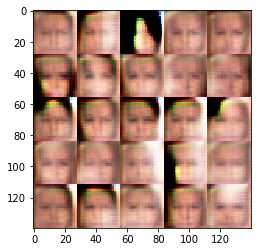

Epoch 1/2... iteration 210... Discriminator Loss: 1.7964... Generator Loss: 1.8532
Epoch 1/2... iteration 220... Discriminator Loss: 1.1749... Generator Loss: 1.9362
Epoch 1/2... iteration 230... Discriminator Loss: 1.5094... Generator Loss: 4.2890
Epoch 1/2... iteration 240... Discriminator Loss: 1.8882... Generator Loss: 4.3448
Epoch 1/2... iteration 250... Discriminator Loss: 2.3181... Generator Loss: 1.1373
Epoch 1/2... iteration 260... Discriminator Loss: 1.6574... Generator Loss: 1.8705
Epoch 1/2... iteration 270... Discriminator Loss: 1.4555... Generator Loss: 3.1729
Epoch 1/2... iteration 280... Discriminator Loss: 2.0450... Generator Loss: 1.5101
Epoch 1/2... iteration 290... Discriminator Loss: 1.0645... Generator Loss: 1.4933
Epoch 1/2... iteration 300... Discriminator Loss: 1.9079... Generator Loss: 0.7068


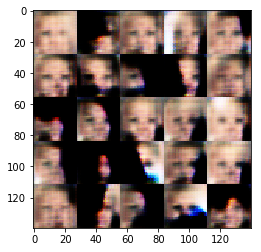

Epoch 1/2... iteration 310... Discriminator Loss: 1.3863... Generator Loss: 1.2535
Epoch 1/2... iteration 320... Discriminator Loss: 1.6088... Generator Loss: 1.1269
Epoch 1/2... iteration 330... Discriminator Loss: 1.2602... Generator Loss: 1.4715
Epoch 1/2... iteration 340... Discriminator Loss: 1.4281... Generator Loss: 1.4192
Epoch 1/2... iteration 350... Discriminator Loss: 1.4189... Generator Loss: 1.4325
Epoch 1/2... iteration 360... Discriminator Loss: 0.7114... Generator Loss: 2.3467
Epoch 1/2... iteration 370... Discriminator Loss: 1.9537... Generator Loss: 0.8704
Epoch 1/2... iteration 380... Discriminator Loss: 1.1521... Generator Loss: 1.3630
Epoch 1/2... iteration 390... Discriminator Loss: 1.2965... Generator Loss: 2.6712
Epoch 1/2... iteration 400... Discriminator Loss: 1.1322... Generator Loss: 1.7280


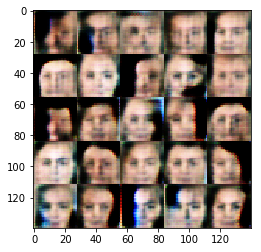

Epoch 1/2... iteration 410... Discriminator Loss: 1.1325... Generator Loss: 1.2896
Epoch 1/2... iteration 420... Discriminator Loss: 1.5410... Generator Loss: 3.8713
Epoch 1/2... iteration 430... Discriminator Loss: 1.8410... Generator Loss: 1.4384
Epoch 1/2... iteration 440... Discriminator Loss: 2.0022... Generator Loss: 3.8287
Epoch 1/2... iteration 450... Discriminator Loss: 1.2276... Generator Loss: 1.4301
Epoch 1/2... iteration 460... Discriminator Loss: 1.9446... Generator Loss: 1.6193
Epoch 1/2... iteration 470... Discriminator Loss: 1.2303... Generator Loss: 2.1739
Epoch 1/2... iteration 480... Discriminator Loss: 1.4268... Generator Loss: 4.0336
Epoch 1/2... iteration 490... Discriminator Loss: 1.2675... Generator Loss: 2.4931
Epoch 1/2... iteration 500... Discriminator Loss: 1.3830... Generator Loss: 1.8620


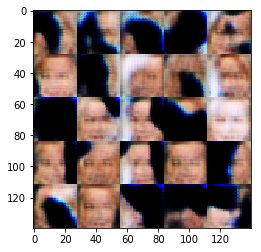

Epoch 1/2... iteration 510... Discriminator Loss: 1.1977... Generator Loss: 1.4442
Epoch 1/2... iteration 520... Discriminator Loss: 1.8617... Generator Loss: 1.8182
Epoch 1/2... iteration 530... Discriminator Loss: 1.8224... Generator Loss: 3.5815
Epoch 1/2... iteration 540... Discriminator Loss: 1.1000... Generator Loss: 1.3684
Epoch 1/2... iteration 550... Discriminator Loss: 0.1971... Generator Loss: 3.1147
Epoch 1/2... iteration 560... Discriminator Loss: 0.3154... Generator Loss: 3.5583
Epoch 1/2... iteration 570... Discriminator Loss: 0.8837... Generator Loss: 2.3130
Epoch 1/2... iteration 580... Discriminator Loss: 1.0655... Generator Loss: 2.0901
Epoch 1/2... iteration 590... Discriminator Loss: 2.8094... Generator Loss: 8.0796
Epoch 1/2... iteration 600... Discriminator Loss: 0.5313... Generator Loss: 2.1025


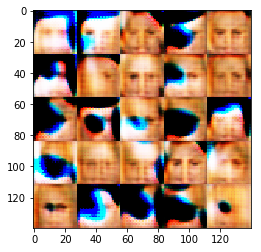

Epoch 1/2... iteration 610... Discriminator Loss: 4.6123... Generator Loss: 0.9291
Epoch 1/2... iteration 620... Discriminator Loss: 1.1043... Generator Loss: 6.0196
Epoch 1/2... iteration 630... Discriminator Loss: 1.4810... Generator Loss: 2.3141
Epoch 1/2... iteration 640... Discriminator Loss: 0.8014... Generator Loss: 1.8367
Epoch 1/2... iteration 650... Discriminator Loss: 1.1303... Generator Loss: 2.1590
Epoch 1/2... iteration 660... Discriminator Loss: 1.4178... Generator Loss: 2.1541
Epoch 1/2... iteration 670... Discriminator Loss: 1.1351... Generator Loss: 1.8676
Epoch 1/2... iteration 680... Discriminator Loss: 1.3958... Generator Loss: 1.1328
Epoch 1/2... iteration 690... Discriminator Loss: 1.0615... Generator Loss: 1.5394
Epoch 1/2... iteration 700... Discriminator Loss: 2.0169... Generator Loss: 2.6863


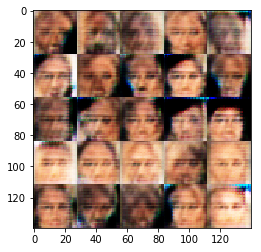

Epoch 1/2... iteration 710... Discriminator Loss: 2.0706... Generator Loss: 3.2608
Epoch 1/2... iteration 720... Discriminator Loss: 1.2986... Generator Loss: 1.3822
Epoch 1/2... iteration 730... Discriminator Loss: 1.2118... Generator Loss: 1.1840
Epoch 1/2... iteration 740... Discriminator Loss: 1.2105... Generator Loss: 1.6433
Epoch 1/2... iteration 750... Discriminator Loss: 0.9069... Generator Loss: 1.8551
Epoch 1/2... iteration 760... Discriminator Loss: 1.9280... Generator Loss: 0.7318
Epoch 1/2... iteration 770... Discriminator Loss: 1.5980... Generator Loss: 1.6772
Epoch 1/2... iteration 780... Discriminator Loss: 1.9031... Generator Loss: 3.1759
Epoch 1/2... iteration 790... Discriminator Loss: 1.5141... Generator Loss: 0.6399
Epoch 1/2... iteration 800... Discriminator Loss: 1.7165... Generator Loss: 0.9575


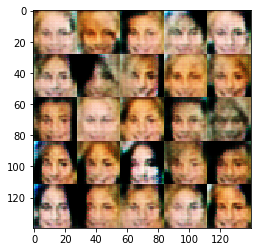

Epoch 1/2... iteration 810... Discriminator Loss: 1.4820... Generator Loss: 1.4117
Epoch 1/2... iteration 820... Discriminator Loss: 1.4179... Generator Loss: 2.3440
Epoch 1/2... iteration 830... Discriminator Loss: 1.2802... Generator Loss: 1.8695
Epoch 1/2... iteration 840... Discriminator Loss: 1.5200... Generator Loss: 1.6597
Epoch 1/2... iteration 850... Discriminator Loss: 0.6409... Generator Loss: 2.4246
Epoch 1/2... iteration 860... Discriminator Loss: 1.1043... Generator Loss: 1.9546
Epoch 1/2... iteration 870... Discriminator Loss: 1.8193... Generator Loss: 3.6765
Epoch 1/2... iteration 880... Discriminator Loss: 1.1302... Generator Loss: 1.8230
Epoch 1/2... iteration 890... Discriminator Loss: 1.1140... Generator Loss: 1.5482
Epoch 1/2... iteration 900... Discriminator Loss: 1.8259... Generator Loss: 0.8955


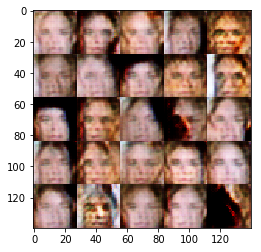

Epoch 1/2... iteration 910... Discriminator Loss: 1.2710... Generator Loss: 1.7401
Epoch 1/2... iteration 920... Discriminator Loss: 1.4762... Generator Loss: 1.4262
Epoch 1/2... iteration 930... Discriminator Loss: 0.6939... Generator Loss: 2.2335
Epoch 1/2... iteration 940... Discriminator Loss: 1.6808... Generator Loss: 2.1344
Epoch 1/2... iteration 950... Discriminator Loss: 1.1412... Generator Loss: 2.4380
Epoch 1/2... iteration 960... Discriminator Loss: 1.4435... Generator Loss: 2.6414
Epoch 1/2... iteration 970... Discriminator Loss: 1.5682... Generator Loss: 0.7776
Epoch 1/2... iteration 980... Discriminator Loss: 1.3986... Generator Loss: 2.0047
Epoch 1/2... iteration 990... Discriminator Loss: 1.9619... Generator Loss: 4.5492
Epoch 1/2... iteration 1000... Discriminator Loss: 1.5404... Generator Loss: 1.4792


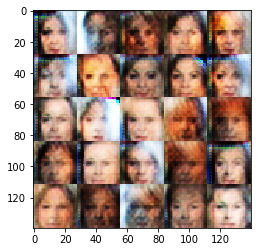

Epoch 1/2... iteration 1010... Discriminator Loss: 1.1265... Generator Loss: 2.7086
Epoch 1/2... iteration 1020... Discriminator Loss: 1.0723... Generator Loss: 2.4897
Epoch 1/2... iteration 1030... Discriminator Loss: 0.9708... Generator Loss: 1.6621
Epoch 1/2... iteration 1040... Discriminator Loss: 1.2871... Generator Loss: 1.8768
Epoch 1/2... iteration 1050... Discriminator Loss: 1.5928... Generator Loss: 3.4520
Epoch 1/2... iteration 1060... Discriminator Loss: 1.3935... Generator Loss: 1.9110
Epoch 1/2... iteration 1070... Discriminator Loss: 1.4784... Generator Loss: 1.2611
Epoch 1/2... iteration 1080... Discriminator Loss: 1.0347... Generator Loss: 2.1516
Epoch 1/2... iteration 1090... Discriminator Loss: 1.2207... Generator Loss: 2.5942
Epoch 1/2... iteration 1100... Discriminator Loss: 1.7201... Generator Loss: 2.1235


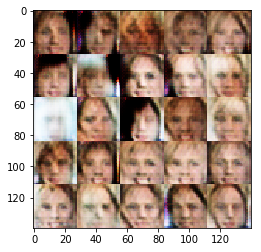

Epoch 1/2... iteration 1110... Discriminator Loss: 1.4968... Generator Loss: 0.8546
Epoch 1/2... iteration 1120... Discriminator Loss: 1.4560... Generator Loss: 2.4389
Epoch 1/2... iteration 1130... Discriminator Loss: 1.0827... Generator Loss: 1.0756
Epoch 1/2... iteration 1140... Discriminator Loss: 1.6290... Generator Loss: 1.8436
Epoch 1/2... iteration 1150... Discriminator Loss: 1.4875... Generator Loss: 1.6319
Epoch 1/2... iteration 1160... Discriminator Loss: 1.7302... Generator Loss: 3.4772
Epoch 1/2... iteration 1170... Discriminator Loss: 1.1897... Generator Loss: 1.4261
Epoch 1/2... iteration 1180... Discriminator Loss: 1.2311... Generator Loss: 1.2835
Epoch 1/2... iteration 1190... Discriminator Loss: 1.5821... Generator Loss: 1.5246
Epoch 1/2... iteration 1200... Discriminator Loss: 1.0470... Generator Loss: 1.5652


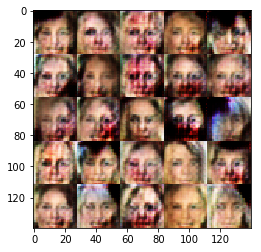

Epoch 1/2... iteration 1210... Discriminator Loss: 2.0731... Generator Loss: 1.2797
Epoch 1/2... iteration 1220... Discriminator Loss: 0.8311... Generator Loss: 1.7162
Epoch 1/2... iteration 1230... Discriminator Loss: 1.3019... Generator Loss: 1.0161
Epoch 1/2... iteration 1240... Discriminator Loss: 2.1425... Generator Loss: 0.7489
Epoch 1/2... iteration 1250... Discriminator Loss: 1.0292... Generator Loss: 1.0219
Epoch 1/2... iteration 1260... Discriminator Loss: 1.2164... Generator Loss: 5.3462
Epoch 1/2... iteration 1270... Discriminator Loss: 1.6114... Generator Loss: 1.6062
Epoch 1/2... iteration 1280... Discriminator Loss: 1.3797... Generator Loss: 2.6686
Epoch 1/2... iteration 1290... Discriminator Loss: 1.2659... Generator Loss: 1.8392
Epoch 1/2... iteration 1300... Discriminator Loss: 1.2929... Generator Loss: 1.5259


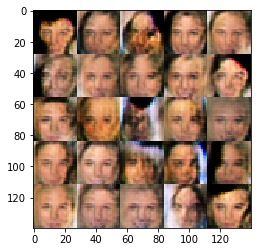

Epoch 1/2... iteration 1310... Discriminator Loss: 1.4550... Generator Loss: 1.3084
Epoch 1/2... iteration 1320... Discriminator Loss: 1.2850... Generator Loss: 1.5774
Epoch 1/2... iteration 1330... Discriminator Loss: 1.1966... Generator Loss: 1.3839
Epoch 1/2... iteration 1340... Discriminator Loss: 1.5753... Generator Loss: 2.4775
Epoch 1/2... iteration 1350... Discriminator Loss: 1.4756... Generator Loss: 2.5830
Epoch 1/2... iteration 1360... Discriminator Loss: 1.2046... Generator Loss: 1.2730
Epoch 1/2... iteration 1370... Discriminator Loss: 1.6259... Generator Loss: 1.7877
Epoch 1/2... iteration 1380... Discriminator Loss: 1.6588... Generator Loss: 3.8442
Epoch 1/2... iteration 1390... Discriminator Loss: 1.2232... Generator Loss: 1.5444
Epoch 1/2... iteration 1400... Discriminator Loss: 1.4000... Generator Loss: 1.4912


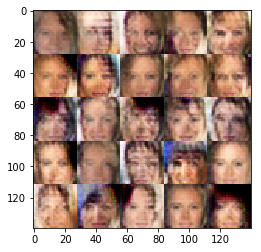

Epoch 1/2... iteration 1410... Discriminator Loss: 2.0349... Generator Loss: 3.9768
Epoch 1/2... iteration 1420... Discriminator Loss: 1.3008... Generator Loss: 1.5095
Epoch 1/2... iteration 1430... Discriminator Loss: 3.4696... Generator Loss: 0.8312
Epoch 1/2... iteration 1440... Discriminator Loss: 1.4503... Generator Loss: 0.8470
Epoch 1/2... iteration 1450... Discriminator Loss: 1.3001... Generator Loss: 1.0219
Epoch 1/2... iteration 1460... Discriminator Loss: 1.3462... Generator Loss: 1.5220
Epoch 1/2... iteration 1470... Discriminator Loss: 0.8854... Generator Loss: 1.6938
Epoch 1/2... iteration 1480... Discriminator Loss: 1.1640... Generator Loss: 2.3623
Epoch 1/2... iteration 1490... Discriminator Loss: 0.6827... Generator Loss: 1.4431
Epoch 1/2... iteration 1500... Discriminator Loss: 2.0851... Generator Loss: 3.5511


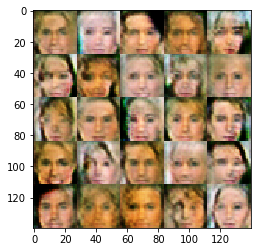

Epoch 1/2... iteration 1510... Discriminator Loss: 1.4709... Generator Loss: 0.6081
Epoch 1/2... iteration 1520... Discriminator Loss: 1.3441... Generator Loss: 1.2032
Epoch 1/2... iteration 1530... Discriminator Loss: 1.5854... Generator Loss: 1.9072
Epoch 1/2... iteration 1540... Discriminator Loss: 1.3512... Generator Loss: 1.6244
Epoch 1/2... iteration 1550... Discriminator Loss: 1.5349... Generator Loss: 1.1179
Epoch 1/2... iteration 1560... Discriminator Loss: 0.9735... Generator Loss: 1.2660
Epoch 1/2... iteration 1570... Discriminator Loss: 0.9555... Generator Loss: 1.4022
Epoch 1/2... iteration 1580... Discriminator Loss: 1.1803... Generator Loss: 1.0459
Epoch 1/2... iteration 1590... Discriminator Loss: 1.0880... Generator Loss: 1.0634
Epoch 1/2... iteration 1600... Discriminator Loss: 1.8758... Generator Loss: 4.7324


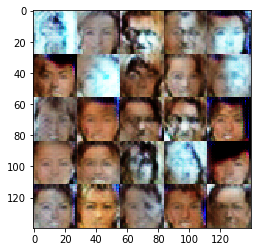

Epoch 1/2... iteration 1610... Discriminator Loss: 0.2992... Generator Loss: 2.3843
Epoch 1/2... iteration 1620... Discriminator Loss: 2.4479... Generator Loss: 2.7365
Epoch 1/2... iteration 1630... Discriminator Loss: 1.0191... Generator Loss: 1.2439
Epoch 1/2... iteration 1640... Discriminator Loss: 1.0560... Generator Loss: 1.0203
Epoch 1/2... iteration 1650... Discriminator Loss: 0.4490... Generator Loss: 2.1792
Epoch 1/2... iteration 1660... Discriminator Loss: 1.4201... Generator Loss: 2.2655
Epoch 1/2... iteration 1670... Discriminator Loss: 0.9237... Generator Loss: 1.6036
Epoch 1/2... iteration 1680... Discriminator Loss: 1.5325... Generator Loss: 1.8410
Epoch 1/2... iteration 1690... Discriminator Loss: 1.4664... Generator Loss: 2.5756
Epoch 1/2... iteration 1700... Discriminator Loss: 1.6335... Generator Loss: 1.9127


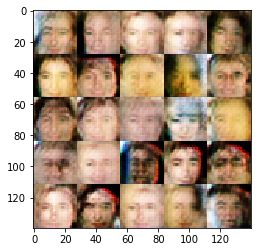

Epoch 1/2... iteration 1710... Discriminator Loss: 1.5043... Generator Loss: 2.7409
Epoch 1/2... iteration 1720... Discriminator Loss: 1.3803... Generator Loss: 1.0302
Epoch 1/2... iteration 1730... Discriminator Loss: 1.3949... Generator Loss: 1.5785
Epoch 1/2... iteration 1740... Discriminator Loss: 1.9905... Generator Loss: 1.6946
Epoch 1/2... iteration 1750... Discriminator Loss: 1.0966... Generator Loss: 1.1669
Epoch 1/2... iteration 1760... Discriminator Loss: 1.3579... Generator Loss: 1.5399
Epoch 1/2... iteration 1770... Discriminator Loss: 1.4058... Generator Loss: 1.1511
Epoch 1/2... iteration 1780... Discriminator Loss: 1.3458... Generator Loss: 1.2282
Epoch 1/2... iteration 1790... Discriminator Loss: 0.9749... Generator Loss: 2.7406
Epoch 1/2... iteration 1800... Discriminator Loss: 1.8563... Generator Loss: 0.6882


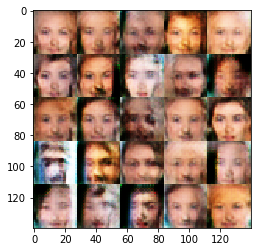

Epoch 1/2... iteration 1810... Discriminator Loss: 0.9180... Generator Loss: 1.5296
Epoch 1/2... iteration 1820... Discriminator Loss: 1.2160... Generator Loss: 1.4972
Epoch 1/2... iteration 1830... Discriminator Loss: 1.4168... Generator Loss: 1.1384
Epoch 1/2... iteration 1840... Discriminator Loss: 1.1689... Generator Loss: 1.1034
Epoch 1/2... iteration 1850... Discriminator Loss: 1.8706... Generator Loss: 3.1372
Epoch 1/2... iteration 1860... Discriminator Loss: 1.5519... Generator Loss: 0.9875
Epoch 1/2... iteration 1870... Discriminator Loss: 1.5433... Generator Loss: 1.5534
Epoch 1/2... iteration 1880... Discriminator Loss: 1.2336... Generator Loss: 0.8391
Epoch 1/2... iteration 1890... Discriminator Loss: 1.4738... Generator Loss: 1.5537
Epoch 1/2... iteration 1900... Discriminator Loss: 1.0224... Generator Loss: 1.3777


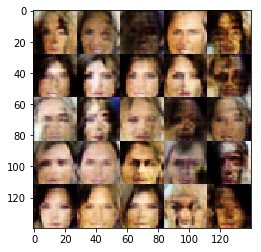

Epoch 1/2... iteration 1910... Discriminator Loss: 0.8908... Generator Loss: 1.3201
Epoch 1/2... iteration 1920... Discriminator Loss: 1.5523... Generator Loss: 3.9815
Epoch 1/2... iteration 1930... Discriminator Loss: 4.6434... Generator Loss: 1.6211
Epoch 1/2... iteration 1940... Discriminator Loss: 1.7136... Generator Loss: 2.2134
Epoch 1/2... iteration 1950... Discriminator Loss: 1.6785... Generator Loss: 3.3484
Epoch 1/2... iteration 1960... Discriminator Loss: 1.4553... Generator Loss: 0.9747
Epoch 1/2... iteration 1970... Discriminator Loss: 1.3010... Generator Loss: 1.5352
Epoch 1/2... iteration 1980... Discriminator Loss: 1.6154... Generator Loss: 3.4794
Epoch 1/2... iteration 1990... Discriminator Loss: 1.4518... Generator Loss: 2.4319
Epoch 1/2... iteration 2000... Discriminator Loss: 1.4192... Generator Loss: 2.1667


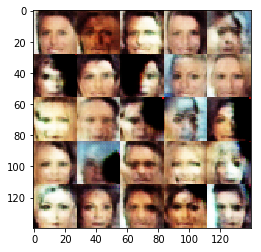

Epoch 1/2... iteration 2010... Discriminator Loss: 1.3397... Generator Loss: 0.9091
Epoch 1/2... iteration 2020... Discriminator Loss: 1.1876... Generator Loss: 1.1293
Epoch 1/2... iteration 2030... Discriminator Loss: 1.2505... Generator Loss: 0.9506
Epoch 1/2... iteration 2040... Discriminator Loss: 1.3574... Generator Loss: 1.4259
Epoch 1/2... iteration 2050... Discriminator Loss: 1.1773... Generator Loss: 1.5603
Epoch 1/2... iteration 2060... Discriminator Loss: 1.2795... Generator Loss: 1.3558
Epoch 1/2... iteration 2070... Discriminator Loss: 1.2657... Generator Loss: 2.1275
Epoch 1/2... iteration 2080... Discriminator Loss: 1.9737... Generator Loss: 2.1961
Epoch 1/2... iteration 2090... Discriminator Loss: 1.0102... Generator Loss: 1.2299
Epoch 1/2... iteration 2100... Discriminator Loss: 1.9469... Generator Loss: 1.0613


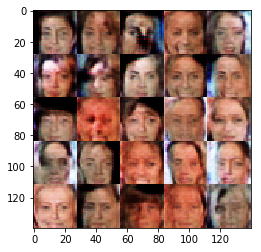

Epoch 1/2... iteration 2110... Discriminator Loss: 1.3934... Generator Loss: 1.1163
Epoch 1/2... iteration 2120... Discriminator Loss: 1.4997... Generator Loss: 1.6164
Epoch 1/2... iteration 2130... Discriminator Loss: 1.3387... Generator Loss: 1.4064
Epoch 1/2... iteration 2140... Discriminator Loss: 1.8119... Generator Loss: 2.3504
Epoch 1/2... iteration 2150... Discriminator Loss: 1.3400... Generator Loss: 1.4970
Epoch 1/2... iteration 2160... Discriminator Loss: 1.7555... Generator Loss: 0.5815
Epoch 1/2... iteration 2170... Discriminator Loss: 1.4479... Generator Loss: 1.4129
Epoch 1/2... iteration 2180... Discriminator Loss: 1.9370... Generator Loss: 2.2381
Epoch 1/2... iteration 2190... Discriminator Loss: 1.4620... Generator Loss: 1.2468
Epoch 1/2... iteration 2200... Discriminator Loss: 1.4039... Generator Loss: 1.3521


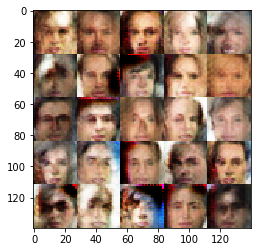

Epoch 1/2... iteration 2210... Discriminator Loss: 1.4733... Generator Loss: 0.8000
Epoch 1/2... iteration 2220... Discriminator Loss: 0.8306... Generator Loss: 1.6047
Epoch 1/2... iteration 2230... Discriminator Loss: 1.3998... Generator Loss: 1.3897
Epoch 1/2... iteration 2240... Discriminator Loss: 1.1589... Generator Loss: 1.5451
Epoch 1/2... iteration 2250... Discriminator Loss: 1.1852... Generator Loss: 1.6789
Epoch 1/2... iteration 2260... Discriminator Loss: 1.3697... Generator Loss: 1.0478
Epoch 1/2... iteration 2270... Discriminator Loss: 1.3080... Generator Loss: 1.6750
Epoch 1/2... iteration 2280... Discriminator Loss: 1.3396... Generator Loss: 1.6272
Epoch 1/2... iteration 2290... Discriminator Loss: 1.3212... Generator Loss: 1.3245
Epoch 1/2... iteration 2300... Discriminator Loss: 1.1837... Generator Loss: 0.9461


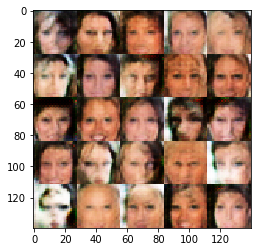

Epoch 1/2... iteration 2310... Discriminator Loss: 1.1199... Generator Loss: 1.2676
Epoch 1/2... iteration 2320... Discriminator Loss: 0.9468... Generator Loss: 1.3737
Epoch 1/2... iteration 2330... Discriminator Loss: 1.6851... Generator Loss: 1.5798
Epoch 1/2... iteration 2340... Discriminator Loss: 1.1771... Generator Loss: 1.4978
Epoch 1/2... iteration 2350... Discriminator Loss: 1.3575... Generator Loss: 1.5339
Epoch 1/2... iteration 2360... Discriminator Loss: 0.8200... Generator Loss: 2.4776
Epoch 1/2... iteration 2370... Discriminator Loss: 1.4410... Generator Loss: 1.3729
Epoch 1/2... iteration 2380... Discriminator Loss: 1.5263... Generator Loss: 1.0234
Epoch 1/2... iteration 2390... Discriminator Loss: 1.4545... Generator Loss: 1.2624
Epoch 1/2... iteration 2400... Discriminator Loss: 1.3018... Generator Loss: 1.4595


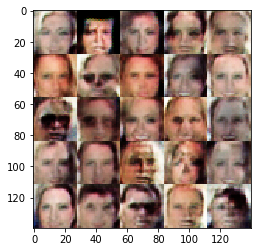

Epoch 1/2... iteration 2410... Discriminator Loss: 1.5069... Generator Loss: 1.1170
Epoch 1/2... iteration 2420... Discriminator Loss: 1.1430... Generator Loss: 0.9675
Epoch 1/2... iteration 2430... Discriminator Loss: 1.5011... Generator Loss: 1.4469
Epoch 1/2... iteration 2440... Discriminator Loss: 0.9821... Generator Loss: 1.3312
Epoch 1/2... iteration 2450... Discriminator Loss: 1.5427... Generator Loss: 1.1083
Epoch 1/2... iteration 2460... Discriminator Loss: 1.4331... Generator Loss: 1.2996
Epoch 1/2... iteration 2470... Discriminator Loss: 1.2501... Generator Loss: 1.2726
Epoch 1/2... iteration 2480... Discriminator Loss: 1.6970... Generator Loss: 1.5497
Epoch 1/2... iteration 2490... Discriminator Loss: 0.9170... Generator Loss: 1.6928
Epoch 1/2... iteration 2500... Discriminator Loss: 1.3210... Generator Loss: 1.0169


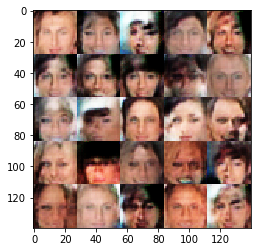

Epoch 1/2... iteration 2510... Discriminator Loss: 1.1902... Generator Loss: 1.2182
Epoch 1/2... iteration 2520... Discriminator Loss: 1.3960... Generator Loss: 1.1752
Epoch 1/2... iteration 2530... Discriminator Loss: 1.3355... Generator Loss: 1.1489
Epoch 1/2... iteration 2540... Discriminator Loss: 1.4229... Generator Loss: 1.0273
Epoch 1/2... iteration 2550... Discriminator Loss: 1.3642... Generator Loss: 1.6257
Epoch 1/2... iteration 2560... Discriminator Loss: 1.3139... Generator Loss: 1.1766
Epoch 1/2... iteration 2570... Discriminator Loss: 2.2133... Generator Loss: 0.3770
Epoch 1/2... iteration 2580... Discriminator Loss: 1.3718... Generator Loss: 1.3156
Epoch 1/2... iteration 2590... Discriminator Loss: 1.3844... Generator Loss: 1.4559
Epoch 1/2... iteration 2600... Discriminator Loss: 1.5176... Generator Loss: 1.1283


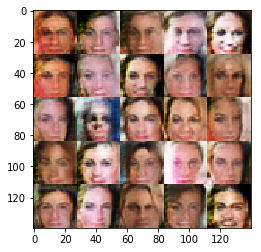

Epoch 1/2... iteration 2610... Discriminator Loss: 1.1174... Generator Loss: 1.6920
Epoch 1/2... iteration 2620... Discriminator Loss: 1.3168... Generator Loss: 0.8597
Epoch 1/2... iteration 2630... Discriminator Loss: 1.3447... Generator Loss: 1.6038
Epoch 1/2... iteration 2640... Discriminator Loss: 1.5336... Generator Loss: 1.7555
Epoch 1/2... iteration 2650... Discriminator Loss: 1.2234... Generator Loss: 1.6461
Epoch 1/2... iteration 2660... Discriminator Loss: 1.7056... Generator Loss: 0.8787
Epoch 1/2... iteration 2670... Discriminator Loss: 1.2580... Generator Loss: 0.9024
Epoch 1/2... iteration 2680... Discriminator Loss: 1.0081... Generator Loss: 1.2102
Epoch 1/2... iteration 2690... Discriminator Loss: 1.2921... Generator Loss: 1.3522
Epoch 1/2... iteration 2700... Discriminator Loss: 0.9973... Generator Loss: 1.1562


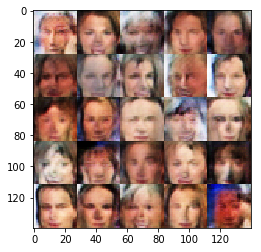

Epoch 1/2... iteration 2710... Discriminator Loss: 1.6194... Generator Loss: 1.1946
Epoch 1/2... iteration 2720... Discriminator Loss: 1.3685... Generator Loss: 0.7571
Epoch 1/2... iteration 2730... Discriminator Loss: 1.3628... Generator Loss: 1.1494
Epoch 1/2... iteration 2740... Discriminator Loss: 1.6898... Generator Loss: 1.6518
Epoch 1/2... iteration 2750... Discriminator Loss: 2.7843... Generator Loss: 7.5850
Epoch 1/2... iteration 2760... Discriminator Loss: 1.5897... Generator Loss: 2.9397
Epoch 1/2... iteration 2770... Discriminator Loss: 2.0319... Generator Loss: 1.8615
Epoch 1/2... iteration 2780... Discriminator Loss: 1.7272... Generator Loss: 2.0476
Epoch 1/2... iteration 2790... Discriminator Loss: 1.5003... Generator Loss: 1.8474
Epoch 1/2... iteration 2800... Discriminator Loss: 1.4357... Generator Loss: 1.4484


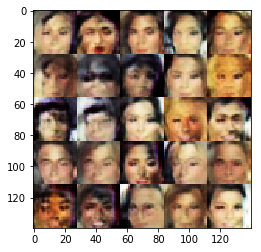

Epoch 1/2... iteration 2810... Discriminator Loss: 1.2018... Generator Loss: 1.3557
Epoch 1/2... iteration 2820... Discriminator Loss: 1.4247... Generator Loss: 1.9872
Epoch 1/2... iteration 2830... Discriminator Loss: 1.1727... Generator Loss: 0.9915
Epoch 1/2... iteration 2840... Discriminator Loss: 1.2374... Generator Loss: 1.2013
Epoch 1/2... iteration 2850... Discriminator Loss: 0.9831... Generator Loss: 1.8504
Epoch 1/2... iteration 2860... Discriminator Loss: 1.0961... Generator Loss: 0.9522
Epoch 1/2... iteration 2870... Discriminator Loss: 1.4896... Generator Loss: 1.1203
Epoch 1/2... iteration 2880... Discriminator Loss: 1.3533... Generator Loss: 0.9640
Epoch 1/2... iteration 2890... Discriminator Loss: 1.1892... Generator Loss: 1.2694
Epoch 1/2... iteration 2900... Discriminator Loss: 1.1879... Generator Loss: 1.3298


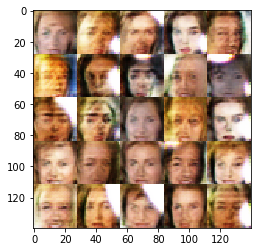

Epoch 1/2... iteration 2910... Discriminator Loss: 1.0998... Generator Loss: 1.4725
Epoch 1/2... iteration 2920... Discriminator Loss: 1.3989... Generator Loss: 1.3726
Epoch 1/2... iteration 2930... Discriminator Loss: 1.2761... Generator Loss: 1.8522
Epoch 1/2... iteration 2940... Discriminator Loss: 1.2696... Generator Loss: 1.1405
Epoch 1/2... iteration 2950... Discriminator Loss: 1.5132... Generator Loss: 1.6452
Epoch 1/2... iteration 2960... Discriminator Loss: 1.1302... Generator Loss: 1.2667
Epoch 1/2... iteration 2970... Discriminator Loss: 1.2000... Generator Loss: 1.8435
Epoch 1/2... iteration 2980... Discriminator Loss: 1.3714... Generator Loss: 1.3432
Epoch 1/2... iteration 2990... Discriminator Loss: 2.1901... Generator Loss: 0.8694
Epoch 1/2... iteration 3000... Discriminator Loss: 1.4433... Generator Loss: 1.0943


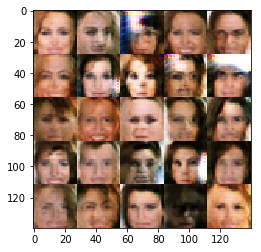

Epoch 1/2... iteration 3010... Discriminator Loss: 1.3718... Generator Loss: 1.4480
Epoch 1/2... iteration 3020... Discriminator Loss: 1.0246... Generator Loss: 1.6839
Epoch 1/2... iteration 3030... Discriminator Loss: 1.1375... Generator Loss: 1.4729
Epoch 1/2... iteration 3040... Discriminator Loss: 1.1358... Generator Loss: 1.5921
Epoch 1/2... iteration 3050... Discriminator Loss: 1.0677... Generator Loss: 1.4496
Epoch 1/2... iteration 3060... Discriminator Loss: 1.9674... Generator Loss: 5.7734
Epoch 1/2... iteration 3070... Discriminator Loss: 2.5804... Generator Loss: 3.8444
Epoch 1/2... iteration 3080... Discriminator Loss: 1.5047... Generator Loss: 1.5867
Epoch 1/2... iteration 3090... Discriminator Loss: 1.9357... Generator Loss: 6.3440
Epoch 1/2... iteration 3100... Discriminator Loss: 0.9818... Generator Loss: 1.3745


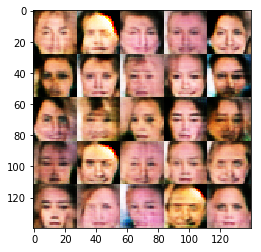

Epoch 1/2... iteration 3110... Discriminator Loss: 0.8917... Generator Loss: 1.4110
Epoch 1/2... iteration 3120... Discriminator Loss: 1.1627... Generator Loss: 1.5891
Epoch 1/2... iteration 3130... Discriminator Loss: 1.2961... Generator Loss: 0.9841
Epoch 1/2... iteration 3140... Discriminator Loss: 1.2165... Generator Loss: 0.9816
Epoch 1/2... iteration 3150... Discriminator Loss: 1.4340... Generator Loss: 0.9822
Epoch 1/2... iteration 3160... Discriminator Loss: 1.2232... Generator Loss: 1.2956
Epoch 2/2... iteration 10... Discriminator Loss: 1.5416... Generator Loss: 0.9829
Epoch 2/2... iteration 20... Discriminator Loss: 1.4794... Generator Loss: 3.4996
Epoch 2/2... iteration 30... Discriminator Loss: 0.8827... Generator Loss: 2.0200
Epoch 2/2... iteration 40... Discriminator Loss: 1.2243... Generator Loss: 1.1328
Epoch 2/2... iteration 50... Discriminator Loss: 1.8160... Generator Loss: 1.5466
Epoch 2/2... iteration 60... Discriminator Loss: 1.1294... Generator Loss: 1.4403
Epoc

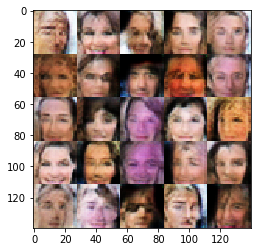

Epoch 2/2... iteration 110... Discriminator Loss: 1.3163... Generator Loss: 1.3364
Epoch 2/2... iteration 120... Discriminator Loss: 1.4336... Generator Loss: 1.1382
Epoch 2/2... iteration 130... Discriminator Loss: 1.4239... Generator Loss: 1.8390
Epoch 2/2... iteration 140... Discriminator Loss: 1.4758... Generator Loss: 2.1987
Epoch 2/2... iteration 150... Discriminator Loss: 1.0533... Generator Loss: 1.3521
Epoch 2/2... iteration 160... Discriminator Loss: 1.2803... Generator Loss: 1.4356
Epoch 2/2... iteration 170... Discriminator Loss: 1.3521... Generator Loss: 0.9899
Epoch 2/2... iteration 180... Discriminator Loss: 1.3156... Generator Loss: 1.1774
Epoch 2/2... iteration 190... Discriminator Loss: 1.3590... Generator Loss: 0.9932
Epoch 2/2... iteration 200... Discriminator Loss: 1.2913... Generator Loss: 1.0002


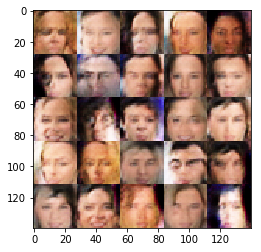

Epoch 2/2... iteration 210... Discriminator Loss: 1.6536... Generator Loss: 1.1562
Epoch 2/2... iteration 220... Discriminator Loss: 1.3565... Generator Loss: 1.1282
Epoch 2/2... iteration 230... Discriminator Loss: 1.0892... Generator Loss: 1.0372
Epoch 2/2... iteration 240... Discriminator Loss: 1.8587... Generator Loss: 1.2940
Epoch 2/2... iteration 250... Discriminator Loss: 1.3779... Generator Loss: 1.3318
Epoch 2/2... iteration 260... Discriminator Loss: 1.4989... Generator Loss: 1.3837
Epoch 2/2... iteration 270... Discriminator Loss: 1.3410... Generator Loss: 0.9510
Epoch 2/2... iteration 280... Discriminator Loss: 1.1797... Generator Loss: 1.0847
Epoch 2/2... iteration 290... Discriminator Loss: 1.4547... Generator Loss: 1.2029
Epoch 2/2... iteration 300... Discriminator Loss: 1.3379... Generator Loss: 1.0967


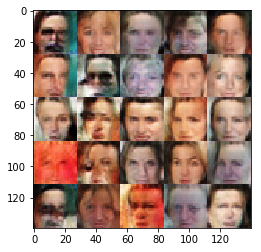

Epoch 2/2... iteration 310... Discriminator Loss: 0.9739... Generator Loss: 1.1806
Epoch 2/2... iteration 320... Discriminator Loss: 1.2564... Generator Loss: 1.0059
Epoch 2/2... iteration 330... Discriminator Loss: 1.2416... Generator Loss: 1.0058
Epoch 2/2... iteration 340... Discriminator Loss: 1.2589... Generator Loss: 1.0217
Epoch 2/2... iteration 350... Discriminator Loss: 1.4122... Generator Loss: 0.8629
Epoch 2/2... iteration 360... Discriminator Loss: 1.2219... Generator Loss: 1.1785
Epoch 2/2... iteration 370... Discriminator Loss: 1.5286... Generator Loss: 1.5493
Epoch 2/2... iteration 380... Discriminator Loss: 1.2167... Generator Loss: 1.0876
Epoch 2/2... iteration 390... Discriminator Loss: 1.3033... Generator Loss: 0.9764
Epoch 2/2... iteration 400... Discriminator Loss: 1.3261... Generator Loss: 1.1148


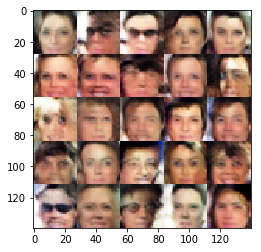

Epoch 2/2... iteration 410... Discriminator Loss: 1.4199... Generator Loss: 1.9657
Epoch 2/2... iteration 420... Discriminator Loss: 1.1984... Generator Loss: 1.6261
Epoch 2/2... iteration 430... Discriminator Loss: 1.3626... Generator Loss: 1.2145
Epoch 2/2... iteration 440... Discriminator Loss: 1.3074... Generator Loss: 1.1150
Epoch 2/2... iteration 450... Discriminator Loss: 1.5287... Generator Loss: 1.8109
Epoch 2/2... iteration 460... Discriminator Loss: 1.1880... Generator Loss: 1.4692
Epoch 2/2... iteration 470... Discriminator Loss: 1.2818... Generator Loss: 0.9787
Epoch 2/2... iteration 480... Discriminator Loss: 1.4449... Generator Loss: 1.1745
Epoch 2/2... iteration 490... Discriminator Loss: 1.3688... Generator Loss: 1.3349
Epoch 2/2... iteration 500... Discriminator Loss: 1.3595... Generator Loss: 0.9900


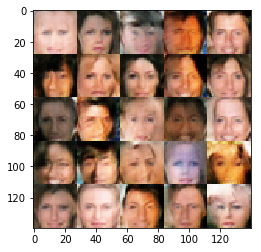

Epoch 2/2... iteration 510... Discriminator Loss: 1.3023... Generator Loss: 1.5707
Epoch 2/2... iteration 520... Discriminator Loss: 1.4732... Generator Loss: 2.1971
Epoch 2/2... iteration 530... Discriminator Loss: 1.4150... Generator Loss: 0.9325
Epoch 2/2... iteration 540... Discriminator Loss: 1.5500... Generator Loss: 1.0870
Epoch 2/2... iteration 550... Discriminator Loss: 1.2084... Generator Loss: 1.1935
Epoch 2/2... iteration 560... Discriminator Loss: 1.6276... Generator Loss: 1.5933
Epoch 2/2... iteration 570... Discriminator Loss: 1.2074... Generator Loss: 1.3694
Epoch 2/2... iteration 580... Discriminator Loss: 1.3546... Generator Loss: 1.9203
Epoch 2/2... iteration 590... Discriminator Loss: 1.5655... Generator Loss: 1.5056
Epoch 2/2... iteration 600... Discriminator Loss: 1.3189... Generator Loss: 1.5014


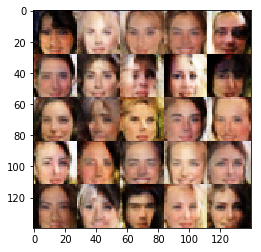

Epoch 2/2... iteration 610... Discriminator Loss: 1.0243... Generator Loss: 1.2908
Epoch 2/2... iteration 620... Discriminator Loss: 1.2309... Generator Loss: 1.0838
Epoch 2/2... iteration 630... Discriminator Loss: 1.6042... Generator Loss: 1.0064
Epoch 2/2... iteration 640... Discriminator Loss: 1.2163... Generator Loss: 0.9761
Epoch 2/2... iteration 650... Discriminator Loss: 1.1908... Generator Loss: 0.9822
Epoch 2/2... iteration 660... Discriminator Loss: 1.4101... Generator Loss: 1.2428
Epoch 2/2... iteration 670... Discriminator Loss: 1.4057... Generator Loss: 1.3195
Epoch 2/2... iteration 680... Discriminator Loss: 1.2980... Generator Loss: 0.9973
Epoch 2/2... iteration 690... Discriminator Loss: 1.2473... Generator Loss: 0.8447
Epoch 2/2... iteration 700... Discriminator Loss: 1.3350... Generator Loss: 0.9169


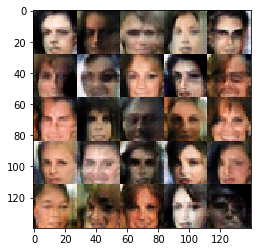

Epoch 2/2... iteration 710... Discriminator Loss: 1.5338... Generator Loss: 1.3309
Epoch 2/2... iteration 720... Discriminator Loss: 1.3058... Generator Loss: 1.5395
Epoch 2/2... iteration 730... Discriminator Loss: 1.4937... Generator Loss: 0.9299
Epoch 2/2... iteration 740... Discriminator Loss: 1.4392... Generator Loss: 0.8359
Epoch 2/2... iteration 750... Discriminator Loss: 1.3608... Generator Loss: 1.2648
Epoch 2/2... iteration 760... Discriminator Loss: 0.9125... Generator Loss: 1.4432
Epoch 2/2... iteration 770... Discriminator Loss: 1.4868... Generator Loss: 1.0621
Epoch 2/2... iteration 780... Discriminator Loss: 1.4646... Generator Loss: 0.6518
Epoch 2/2... iteration 790... Discriminator Loss: 0.9869... Generator Loss: 1.1522
Epoch 2/2... iteration 800... Discriminator Loss: 1.3866... Generator Loss: 1.3257


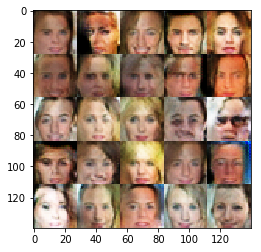

Epoch 2/2... iteration 810... Discriminator Loss: 1.7626... Generator Loss: 1.7758
Epoch 2/2... iteration 820... Discriminator Loss: 1.5922... Generator Loss: 1.2213
Epoch 2/2... iteration 830... Discriminator Loss: 0.9332... Generator Loss: 1.1450
Epoch 2/2... iteration 840... Discriminator Loss: 1.2999... Generator Loss: 1.3403
Epoch 2/2... iteration 850... Discriminator Loss: 1.2662... Generator Loss: 1.2037
Epoch 2/2... iteration 860... Discriminator Loss: 1.4441... Generator Loss: 0.7367
Epoch 2/2... iteration 870... Discriminator Loss: 1.3177... Generator Loss: 1.1519
Epoch 2/2... iteration 880... Discriminator Loss: 1.4031... Generator Loss: 1.5942
Epoch 2/2... iteration 890... Discriminator Loss: 1.6205... Generator Loss: 1.7359
Epoch 2/2... iteration 900... Discriminator Loss: 0.9328... Generator Loss: 1.1489


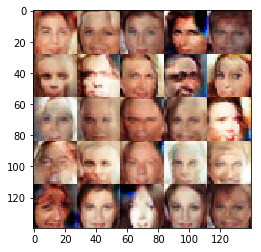

Epoch 2/2... iteration 910... Discriminator Loss: 1.5718... Generator Loss: 1.1649
Epoch 2/2... iteration 920... Discriminator Loss: 1.0916... Generator Loss: 1.2237
Epoch 2/2... iteration 930... Discriminator Loss: 1.3363... Generator Loss: 1.0631
Epoch 2/2... iteration 940... Discriminator Loss: 1.3442... Generator Loss: 1.0628
Epoch 2/2... iteration 950... Discriminator Loss: 1.1791... Generator Loss: 0.9672
Epoch 2/2... iteration 960... Discriminator Loss: 1.3293... Generator Loss: 1.0796
Epoch 2/2... iteration 970... Discriminator Loss: 1.5933... Generator Loss: 0.7209
Epoch 2/2... iteration 980... Discriminator Loss: 1.3687... Generator Loss: 1.4094
Epoch 2/2... iteration 990... Discriminator Loss: 1.4021... Generator Loss: 1.5162
Epoch 2/2... iteration 1000... Discriminator Loss: 1.2714... Generator Loss: 1.2626


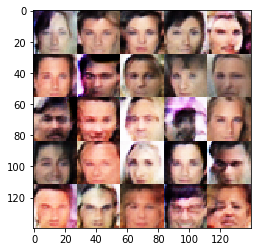

Epoch 2/2... iteration 1010... Discriminator Loss: 1.3397... Generator Loss: 1.0766
Epoch 2/2... iteration 1020... Discriminator Loss: 1.3467... Generator Loss: 0.7263
Epoch 2/2... iteration 1030... Discriminator Loss: 1.4159... Generator Loss: 1.2215
Epoch 2/2... iteration 1040... Discriminator Loss: 1.1469... Generator Loss: 1.4746
Epoch 2/2... iteration 1050... Discriminator Loss: 1.3882... Generator Loss: 1.1532
Epoch 2/2... iteration 1060... Discriminator Loss: 1.6420... Generator Loss: 1.6064
Epoch 2/2... iteration 1070... Discriminator Loss: 1.0273... Generator Loss: 1.4265
Epoch 2/2... iteration 1080... Discriminator Loss: 1.4955... Generator Loss: 0.8594
Epoch 2/2... iteration 1090... Discriminator Loss: 1.5151... Generator Loss: 1.4165
Epoch 2/2... iteration 1100... Discriminator Loss: 1.4166... Generator Loss: 1.1987


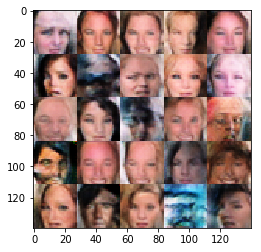

Epoch 2/2... iteration 1110... Discriminator Loss: 1.4443... Generator Loss: 1.0299
Epoch 2/2... iteration 1120... Discriminator Loss: 1.5393... Generator Loss: 1.6510
Epoch 2/2... iteration 1130... Discriminator Loss: 1.3955... Generator Loss: 1.3111
Epoch 2/2... iteration 1140... Discriminator Loss: 1.3890... Generator Loss: 1.4695
Epoch 2/2... iteration 1150... Discriminator Loss: 1.4577... Generator Loss: 0.9530
Epoch 2/2... iteration 1160... Discriminator Loss: 1.2583... Generator Loss: 1.3977
Epoch 2/2... iteration 1170... Discriminator Loss: 1.2298... Generator Loss: 1.0599
Epoch 2/2... iteration 1180... Discriminator Loss: 1.4954... Generator Loss: 0.8491
Epoch 2/2... iteration 1190... Discriminator Loss: 1.3659... Generator Loss: 0.8417
Epoch 2/2... iteration 1200... Discriminator Loss: 1.4021... Generator Loss: 1.2126


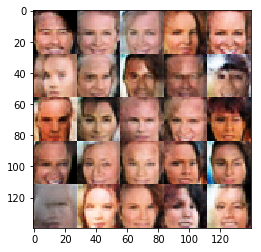

Epoch 2/2... iteration 1210... Discriminator Loss: 1.4263... Generator Loss: 0.9334
Epoch 2/2... iteration 1220... Discriminator Loss: 1.4994... Generator Loss: 1.1910
Epoch 2/2... iteration 1230... Discriminator Loss: 1.2312... Generator Loss: 1.1764
Epoch 2/2... iteration 1240... Discriminator Loss: 0.8386... Generator Loss: 1.4734
Epoch 2/2... iteration 1250... Discriminator Loss: 1.1947... Generator Loss: 1.1204
Epoch 2/2... iteration 1260... Discriminator Loss: 1.3246... Generator Loss: 1.2243
Epoch 2/2... iteration 1270... Discriminator Loss: 1.4720... Generator Loss: 1.5068
Epoch 2/2... iteration 1280... Discriminator Loss: 1.4630... Generator Loss: 1.3095
Epoch 2/2... iteration 1290... Discriminator Loss: 1.2327... Generator Loss: 1.0867
Epoch 2/2... iteration 1300... Discriminator Loss: 1.1504... Generator Loss: 1.1597


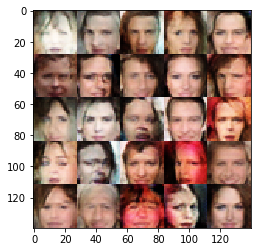

Epoch 2/2... iteration 1310... Discriminator Loss: 1.5025... Generator Loss: 1.3022
Epoch 2/2... iteration 1320... Discriminator Loss: 1.5357... Generator Loss: 1.6567
Epoch 2/2... iteration 1330... Discriminator Loss: 1.1371... Generator Loss: 0.9883
Epoch 2/2... iteration 1340... Discriminator Loss: 1.4376... Generator Loss: 0.8639
Epoch 2/2... iteration 1350... Discriminator Loss: 1.3372... Generator Loss: 0.9915
Epoch 2/2... iteration 1360... Discriminator Loss: 1.6355... Generator Loss: 1.3253
Epoch 2/2... iteration 1370... Discriminator Loss: 1.4638... Generator Loss: 1.1737
Epoch 2/2... iteration 1380... Discriminator Loss: 1.3943... Generator Loss: 1.0810
Epoch 2/2... iteration 1390... Discriminator Loss: 1.3042... Generator Loss: 1.0658
Epoch 2/2... iteration 1400... Discriminator Loss: 1.3434... Generator Loss: 1.3572


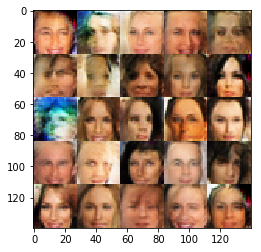

Epoch 2/2... iteration 1410... Discriminator Loss: 1.6444... Generator Loss: 0.9233
Epoch 2/2... iteration 1420... Discriminator Loss: 2.0468... Generator Loss: 1.6479
Epoch 2/2... iteration 1430... Discriminator Loss: 1.0816... Generator Loss: 1.2700
Epoch 2/2... iteration 1440... Discriminator Loss: 1.2750... Generator Loss: 1.0732
Epoch 2/2... iteration 1450... Discriminator Loss: 1.4164... Generator Loss: 1.9510
Epoch 2/2... iteration 1460... Discriminator Loss: 1.3831... Generator Loss: 1.0944
Epoch 2/2... iteration 1470... Discriminator Loss: 1.0423... Generator Loss: 1.2240
Epoch 2/2... iteration 1480... Discriminator Loss: 1.3806... Generator Loss: 0.9338
Epoch 2/2... iteration 1490... Discriminator Loss: 1.3786... Generator Loss: 1.2052
Epoch 2/2... iteration 1500... Discriminator Loss: 1.4516... Generator Loss: 1.0175


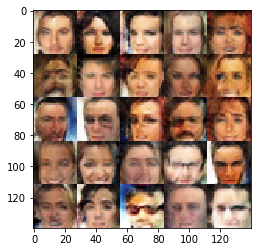

Epoch 2/2... iteration 1510... Discriminator Loss: 1.4131... Generator Loss: 0.9968
Epoch 2/2... iteration 1520... Discriminator Loss: 1.5086... Generator Loss: 0.8568
Epoch 2/2... iteration 1530... Discriminator Loss: 1.3753... Generator Loss: 1.3694
Epoch 2/2... iteration 1540... Discriminator Loss: 1.4011... Generator Loss: 1.3818
Epoch 2/2... iteration 1550... Discriminator Loss: 1.2142... Generator Loss: 1.1369
Epoch 2/2... iteration 1560... Discriminator Loss: 1.2615... Generator Loss: 0.9197
Epoch 2/2... iteration 1570... Discriminator Loss: 1.3952... Generator Loss: 1.0907
Epoch 2/2... iteration 1580... Discriminator Loss: 1.1859... Generator Loss: 1.1479
Epoch 2/2... iteration 1590... Discriminator Loss: 1.2943... Generator Loss: 0.8210
Epoch 2/2... iteration 1600... Discriminator Loss: 1.3248... Generator Loss: 1.1610


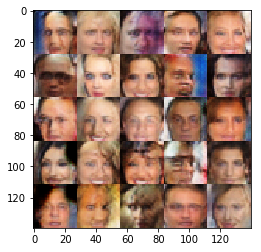

Epoch 2/2... iteration 1610... Discriminator Loss: 1.2392... Generator Loss: 1.4983
Epoch 2/2... iteration 1620... Discriminator Loss: 1.5798... Generator Loss: 1.1359
Epoch 2/2... iteration 1630... Discriminator Loss: 1.1026... Generator Loss: 1.0004
Epoch 2/2... iteration 1640... Discriminator Loss: 1.3721... Generator Loss: 1.7516
Epoch 2/2... iteration 1650... Discriminator Loss: 1.2287... Generator Loss: 1.0735
Epoch 2/2... iteration 1660... Discriminator Loss: 1.5624... Generator Loss: 1.3128
Epoch 2/2... iteration 1670... Discriminator Loss: 1.5780... Generator Loss: 1.8139
Epoch 2/2... iteration 1680... Discriminator Loss: 1.3717... Generator Loss: 1.0121
Epoch 2/2... iteration 1690... Discriminator Loss: 1.2340... Generator Loss: 1.2220
Epoch 2/2... iteration 1700... Discriminator Loss: 1.3131... Generator Loss: 0.9423


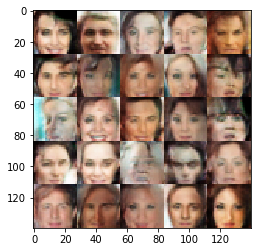

Epoch 2/2... iteration 1710... Discriminator Loss: 1.2123... Generator Loss: 1.2200
Epoch 2/2... iteration 1720... Discriminator Loss: 1.2793... Generator Loss: 1.0239
Epoch 2/2... iteration 1730... Discriminator Loss: 1.5167... Generator Loss: 1.1671
Epoch 2/2... iteration 1740... Discriminator Loss: 1.3793... Generator Loss: 1.0538
Epoch 2/2... iteration 1750... Discriminator Loss: 1.9686... Generator Loss: 1.8998
Epoch 2/2... iteration 1760... Discriminator Loss: 1.6835... Generator Loss: 1.0759
Epoch 2/2... iteration 1770... Discriminator Loss: 1.2509... Generator Loss: 1.3854
Epoch 2/2... iteration 1780... Discriminator Loss: 1.3291... Generator Loss: 0.8485
Epoch 2/2... iteration 1790... Discriminator Loss: 1.2155... Generator Loss: 0.8736
Epoch 2/2... iteration 1800... Discriminator Loss: 1.4137... Generator Loss: 0.7823


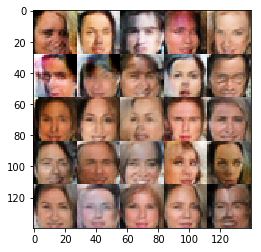

Epoch 2/2... iteration 1810... Discriminator Loss: 1.7301... Generator Loss: 1.1053
Epoch 2/2... iteration 1820... Discriminator Loss: 1.2780... Generator Loss: 1.2620
Epoch 2/2... iteration 1830... Discriminator Loss: 1.5667... Generator Loss: 0.7494
Epoch 2/2... iteration 1840... Discriminator Loss: 0.9162... Generator Loss: 1.2544
Epoch 2/2... iteration 1850... Discriminator Loss: 1.3961... Generator Loss: 0.9162
Epoch 2/2... iteration 1860... Discriminator Loss: 1.4941... Generator Loss: 0.9116
Epoch 2/2... iteration 1870... Discriminator Loss: 1.6563... Generator Loss: 1.3356
Epoch 2/2... iteration 1880... Discriminator Loss: 1.2910... Generator Loss: 0.9653
Epoch 2/2... iteration 1890... Discriminator Loss: 1.4376... Generator Loss: 1.0533
Epoch 2/2... iteration 1900... Discriminator Loss: 1.4702... Generator Loss: 1.3427


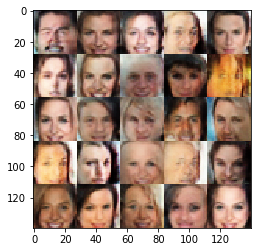

Epoch 2/2... iteration 1910... Discriminator Loss: 1.1494... Generator Loss: 0.9300
Epoch 2/2... iteration 1920... Discriminator Loss: 1.3765... Generator Loss: 1.0696
Epoch 2/2... iteration 1930... Discriminator Loss: 1.4501... Generator Loss: 1.1913
Epoch 2/2... iteration 1940... Discriminator Loss: 1.4893... Generator Loss: 1.2202
Epoch 2/2... iteration 1950... Discriminator Loss: 1.4367... Generator Loss: 0.9873
Epoch 2/2... iteration 1960... Discriminator Loss: 1.5008... Generator Loss: 0.8731
Epoch 2/2... iteration 1970... Discriminator Loss: 1.4757... Generator Loss: 1.1460
Epoch 2/2... iteration 1980... Discriminator Loss: 1.4459... Generator Loss: 1.2441
Epoch 2/2... iteration 1990... Discriminator Loss: 1.3716... Generator Loss: 1.0428
Epoch 2/2... iteration 2000... Discriminator Loss: 1.4221... Generator Loss: 1.1386


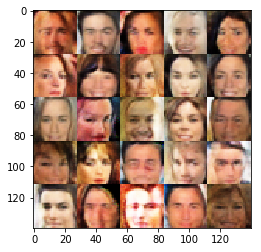

Epoch 2/2... iteration 2010... Discriminator Loss: 1.3780... Generator Loss: 0.8838
Epoch 2/2... iteration 2020... Discriminator Loss: 1.2880... Generator Loss: 1.0240
Epoch 2/2... iteration 2030... Discriminator Loss: 1.4096... Generator Loss: 0.9481
Epoch 2/2... iteration 2040... Discriminator Loss: 1.2373... Generator Loss: 1.0063
Epoch 2/2... iteration 2050... Discriminator Loss: 1.3011... Generator Loss: 1.0476
Epoch 2/2... iteration 2060... Discriminator Loss: 1.3546... Generator Loss: 1.0063
Epoch 2/2... iteration 2070... Discriminator Loss: 1.3967... Generator Loss: 1.1692
Epoch 2/2... iteration 2080... Discriminator Loss: 1.5391... Generator Loss: 1.1581
Epoch 2/2... iteration 2090... Discriminator Loss: 1.4095... Generator Loss: 0.9727
Epoch 2/2... iteration 2100... Discriminator Loss: 1.5022... Generator Loss: 1.4659


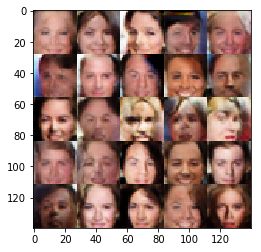

Epoch 2/2... iteration 2110... Discriminator Loss: 1.3232... Generator Loss: 1.1689
Epoch 2/2... iteration 2120... Discriminator Loss: 1.4145... Generator Loss: 1.2340
Epoch 2/2... iteration 2130... Discriminator Loss: 1.3100... Generator Loss: 0.9326
Epoch 2/2... iteration 2140... Discriminator Loss: 1.4722... Generator Loss: 1.0431
Epoch 2/2... iteration 2150... Discriminator Loss: 1.2952... Generator Loss: 1.2781
Epoch 2/2... iteration 2160... Discriminator Loss: 1.3716... Generator Loss: 1.8570
Epoch 2/2... iteration 2170... Discriminator Loss: 1.3108... Generator Loss: 1.3104
Epoch 2/2... iteration 2180... Discriminator Loss: 1.5783... Generator Loss: 1.4506
Epoch 2/2... iteration 2190... Discriminator Loss: 1.4346... Generator Loss: 1.1305
Epoch 2/2... iteration 2200... Discriminator Loss: 1.3994... Generator Loss: 1.0885


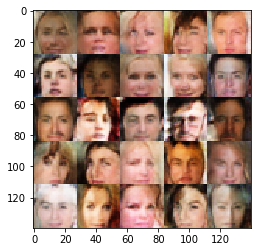

Epoch 2/2... iteration 2210... Discriminator Loss: 1.3834... Generator Loss: 0.7522
Epoch 2/2... iteration 2220... Discriminator Loss: 1.6035... Generator Loss: 1.1520
Epoch 2/2... iteration 2230... Discriminator Loss: 1.6199... Generator Loss: 1.5121
Epoch 2/2... iteration 2240... Discriminator Loss: 1.4183... Generator Loss: 0.8306
Epoch 2/2... iteration 2250... Discriminator Loss: 1.2947... Generator Loss: 0.8225
Epoch 2/2... iteration 2260... Discriminator Loss: 1.4510... Generator Loss: 1.4702
Epoch 2/2... iteration 2270... Discriminator Loss: 0.8638... Generator Loss: 1.4979
Epoch 2/2... iteration 2280... Discriminator Loss: 1.5472... Generator Loss: 1.4518
Epoch 2/2... iteration 2290... Discriminator Loss: 1.2514... Generator Loss: 1.3251
Epoch 2/2... iteration 2300... Discriminator Loss: 1.4471... Generator Loss: 0.8138


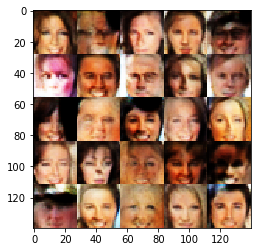

Epoch 2/2... iteration 2310... Discriminator Loss: 1.3779... Generator Loss: 1.2361
Epoch 2/2... iteration 2320... Discriminator Loss: 1.4574... Generator Loss: 1.2585
Epoch 2/2... iteration 2330... Discriminator Loss: 1.4657... Generator Loss: 1.0058
Epoch 2/2... iteration 2340... Discriminator Loss: 1.3026... Generator Loss: 1.0842
Epoch 2/2... iteration 2350... Discriminator Loss: 1.4968... Generator Loss: 1.0277
Epoch 2/2... iteration 2360... Discriminator Loss: 1.2345... Generator Loss: 1.2740
Epoch 2/2... iteration 2370... Discriminator Loss: 1.3294... Generator Loss: 1.0432
Epoch 2/2... iteration 2380... Discriminator Loss: 1.4796... Generator Loss: 1.4234
Epoch 2/2... iteration 2390... Discriminator Loss: 1.3375... Generator Loss: 1.6225
Epoch 2/2... iteration 2400... Discriminator Loss: 1.2623... Generator Loss: 1.0577


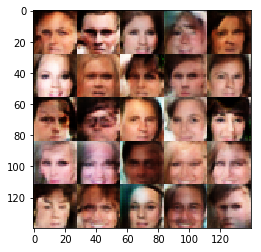

Epoch 2/2... iteration 2410... Discriminator Loss: 1.4282... Generator Loss: 1.0841
Epoch 2/2... iteration 2420... Discriminator Loss: 1.2549... Generator Loss: 1.0913
Epoch 2/2... iteration 2430... Discriminator Loss: 1.5243... Generator Loss: 1.4615
Epoch 2/2... iteration 2440... Discriminator Loss: 1.2387... Generator Loss: 0.9995
Epoch 2/2... iteration 2450... Discriminator Loss: 1.5289... Generator Loss: 1.0431
Epoch 2/2... iteration 2460... Discriminator Loss: 1.3831... Generator Loss: 0.9303
Epoch 2/2... iteration 2470... Discriminator Loss: 1.4169... Generator Loss: 1.0893
Epoch 2/2... iteration 2480... Discriminator Loss: 1.1028... Generator Loss: 1.1936
Epoch 2/2... iteration 2490... Discriminator Loss: 1.2171... Generator Loss: 1.0648
Epoch 2/2... iteration 2500... Discriminator Loss: 1.0305... Generator Loss: 2.0385


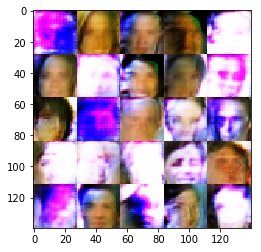

Epoch 2/2... iteration 2510... Discriminator Loss: 1.2918... Generator Loss: 1.5068
Epoch 2/2... iteration 2520... Discriminator Loss: 1.8079... Generator Loss: 0.7158
Epoch 2/2... iteration 2530... Discriminator Loss: 1.4683... Generator Loss: 1.6598
Epoch 2/2... iteration 2540... Discriminator Loss: 1.3876... Generator Loss: 1.0225
Epoch 2/2... iteration 2550... Discriminator Loss: 1.3053... Generator Loss: 1.1911
Epoch 2/2... iteration 2560... Discriminator Loss: 1.3245... Generator Loss: 0.8517
Epoch 2/2... iteration 2570... Discriminator Loss: 1.4453... Generator Loss: 0.8649
Epoch 2/2... iteration 2580... Discriminator Loss: 1.3567... Generator Loss: 1.0596
Epoch 2/2... iteration 2590... Discriminator Loss: 1.2826... Generator Loss: 1.0887
Epoch 2/2... iteration 2600... Discriminator Loss: 1.3998... Generator Loss: 0.8435


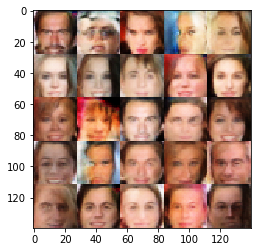

Epoch 2/2... iteration 2610... Discriminator Loss: 1.3287... Generator Loss: 0.8671
Epoch 2/2... iteration 2620... Discriminator Loss: 1.3231... Generator Loss: 0.9749
Epoch 2/2... iteration 2630... Discriminator Loss: 1.3830... Generator Loss: 1.0157
Epoch 2/2... iteration 2640... Discriminator Loss: 1.5111... Generator Loss: 0.8901
Epoch 2/2... iteration 2650... Discriminator Loss: 1.2170... Generator Loss: 0.9785
Epoch 2/2... iteration 2660... Discriminator Loss: 1.6481... Generator Loss: 1.1499
Epoch 2/2... iteration 2670... Discriminator Loss: 1.3856... Generator Loss: 0.8934
Epoch 2/2... iteration 2680... Discriminator Loss: 1.2455... Generator Loss: 1.0165
Epoch 2/2... iteration 2690... Discriminator Loss: 1.2521... Generator Loss: 0.9923
Epoch 2/2... iteration 2700... Discriminator Loss: 1.4061... Generator Loss: 1.2127


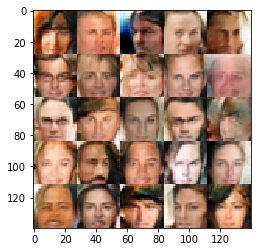

Epoch 2/2... iteration 2710... Discriminator Loss: 1.4354... Generator Loss: 0.9201
Epoch 2/2... iteration 2720... Discriminator Loss: 1.2913... Generator Loss: 1.0012
Epoch 2/2... iteration 2730... Discriminator Loss: 1.3669... Generator Loss: 0.9681
Epoch 2/2... iteration 2740... Discriminator Loss: 1.4611... Generator Loss: 0.9723
Epoch 2/2... iteration 2750... Discriminator Loss: 1.6595... Generator Loss: 1.5596
Epoch 2/2... iteration 2760... Discriminator Loss: 1.2848... Generator Loss: 1.1811
Epoch 2/2... iteration 2770... Discriminator Loss: 1.4152... Generator Loss: 0.8913
Epoch 2/2... iteration 2780... Discriminator Loss: 1.3296... Generator Loss: 0.9695
Epoch 2/2... iteration 2790... Discriminator Loss: 1.4401... Generator Loss: 0.9792
Epoch 2/2... iteration 2800... Discriminator Loss: 1.3812... Generator Loss: 0.9931


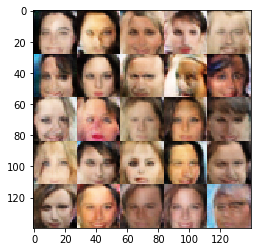

Epoch 2/2... iteration 2810... Discriminator Loss: 1.4030... Generator Loss: 0.9994
Epoch 2/2... iteration 2820... Discriminator Loss: 1.3635... Generator Loss: 0.9798
Epoch 2/2... iteration 2830... Discriminator Loss: 1.2327... Generator Loss: 1.0712
Epoch 2/2... iteration 2840... Discriminator Loss: 1.2442... Generator Loss: 1.0199
Epoch 2/2... iteration 2850... Discriminator Loss: 1.1827... Generator Loss: 1.0081
Epoch 2/2... iteration 2860... Discriminator Loss: 1.3121... Generator Loss: 0.9307
Epoch 2/2... iteration 2870... Discriminator Loss: 1.5481... Generator Loss: 0.9190
Epoch 2/2... iteration 2880... Discriminator Loss: 1.1227... Generator Loss: 1.2625
Epoch 2/2... iteration 2890... Discriminator Loss: 1.0303... Generator Loss: 1.2240
Epoch 2/2... iteration 2900... Discriminator Loss: 1.2712... Generator Loss: 1.6482


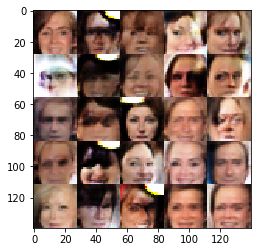

Epoch 2/2... iteration 2910... Discriminator Loss: 1.4602... Generator Loss: 0.9742
Epoch 2/2... iteration 2920... Discriminator Loss: 1.4234... Generator Loss: 1.1461
Epoch 2/2... iteration 2930... Discriminator Loss: 1.3157... Generator Loss: 1.3383
Epoch 2/2... iteration 2940... Discriminator Loss: 1.3073... Generator Loss: 0.9232
Epoch 2/2... iteration 2950... Discriminator Loss: 1.3967... Generator Loss: 1.6358
Epoch 2/2... iteration 2960... Discriminator Loss: 1.0719... Generator Loss: 1.3847
Epoch 2/2... iteration 2970... Discriminator Loss: 1.1387... Generator Loss: 1.6499
Epoch 2/2... iteration 2980... Discriminator Loss: 1.2467... Generator Loss: 1.9142
Epoch 2/2... iteration 2990... Discriminator Loss: 1.3564... Generator Loss: 1.0225
Epoch 2/2... iteration 3000... Discriminator Loss: 1.4987... Generator Loss: 0.7170


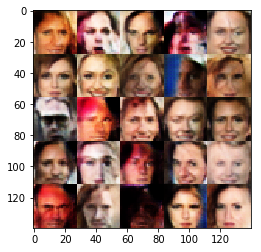

Epoch 2/2... iteration 3010... Discriminator Loss: 1.1631... Generator Loss: 1.1112
Epoch 2/2... iteration 3020... Discriminator Loss: 1.6203... Generator Loss: 2.2810
Epoch 2/2... iteration 3030... Discriminator Loss: 1.3567... Generator Loss: 0.9314
Epoch 2/2... iteration 3040... Discriminator Loss: 1.2744... Generator Loss: 1.0938
Epoch 2/2... iteration 3050... Discriminator Loss: 1.2994... Generator Loss: 1.0606
Epoch 2/2... iteration 3060... Discriminator Loss: 0.9646... Generator Loss: 2.3773
Epoch 2/2... iteration 3070... Discriminator Loss: 1.4490... Generator Loss: 1.5730
Epoch 2/2... iteration 3080... Discriminator Loss: 1.2518... Generator Loss: 1.2177
Epoch 2/2... iteration 3090... Discriminator Loss: 1.3652... Generator Loss: 1.1709
Epoch 2/2... iteration 3100... Discriminator Loss: 1.2109... Generator Loss: 0.8935


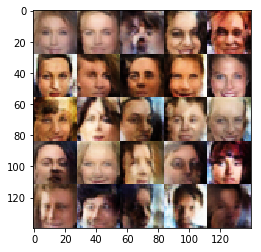

Epoch 2/2... iteration 3110... Discriminator Loss: 1.5201... Generator Loss: 1.4913
Epoch 2/2... iteration 3120... Discriminator Loss: 1.3327... Generator Loss: 1.0258
Epoch 2/2... iteration 3130... Discriminator Loss: 1.4284... Generator Loss: 0.8626
Epoch 2/2... iteration 3140... Discriminator Loss: 1.9066... Generator Loss: 2.8662
Epoch 2/2... iteration 3150... Discriminator Loss: 1.6587... Generator Loss: 0.6371
Epoch 2/2... iteration 3160... Discriminator Loss: 1.4367... Generator Loss: 0.8627


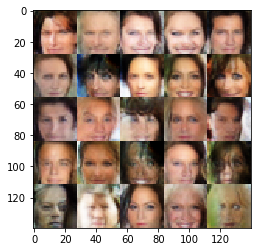

In [27]:
batch_size = 64
z_dim = 200
learning_rate = 0.0005
beta1 = 0.3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

Epoch 1/2... iteration 10... Discriminator Loss: 2.8931... Generator Loss: 14.3968
Epoch 1/2... iteration 20... Discriminator Loss: 1.2498... Generator Loss: 5.5148
Epoch 1/2... iteration 30... Discriminator Loss: 2.0440... Generator Loss: 5.7487
Epoch 1/2... iteration 40... Discriminator Loss: 2.7746... Generator Loss: 8.0606
Epoch 1/2... iteration 50... Discriminator Loss: 3.9634... Generator Loss: 6.3006
Epoch 1/2... iteration 60... Discriminator Loss: 1.1295... Generator Loss: 4.0317
Epoch 1/2... iteration 70... Discriminator Loss: 2.3988... Generator Loss: 6.2209
Epoch 1/2... iteration 80... Discriminator Loss: 1.1515... Generator Loss: 3.2539
Epoch 1/2... iteration 90... Discriminator Loss: 1.5943... Generator Loss: 2.9689
Epoch 1/2... iteration 100... Discriminator Loss: 2.2925... Generator Loss: 6.3524


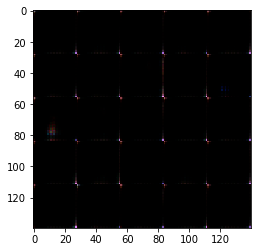

Epoch 1/2... iteration 110... Discriminator Loss: 1.0584... Generator Loss: 1.9730
Epoch 1/2... iteration 120... Discriminator Loss: 1.6533... Generator Loss: 2.6765
Epoch 1/2... iteration 130... Discriminator Loss: 1.9213... Generator Loss: 1.7280
Epoch 1/2... iteration 140... Discriminator Loss: 1.6761... Generator Loss: 4.1431
Epoch 1/2... iteration 150... Discriminator Loss: 1.1797... Generator Loss: 2.5570
Epoch 1/2... iteration 160... Discriminator Loss: 3.7403... Generator Loss: 2.3974
Epoch 1/2... iteration 170... Discriminator Loss: 1.4398... Generator Loss: 4.4346
Epoch 1/2... iteration 180... Discriminator Loss: 1.5834... Generator Loss: 4.1889
Epoch 1/2... iteration 190... Discriminator Loss: 1.7596... Generator Loss: 3.7561
Epoch 1/2... iteration 200... Discriminator Loss: 1.1909... Generator Loss: 1.7108


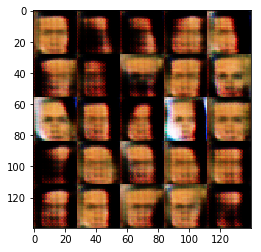

Epoch 1/2... iteration 210... Discriminator Loss: 1.6933... Generator Loss: 2.1909
Epoch 1/2... iteration 220... Discriminator Loss: 1.3404... Generator Loss: 1.7845
Epoch 1/2... iteration 230... Discriminator Loss: 1.8765... Generator Loss: 3.2321
Epoch 1/2... iteration 240... Discriminator Loss: 1.2646... Generator Loss: 1.3630
Epoch 1/2... iteration 250... Discriminator Loss: 1.5255... Generator Loss: 2.9190
Epoch 1/2... iteration 260... Discriminator Loss: 1.6261... Generator Loss: 1.5182
Epoch 1/2... iteration 270... Discriminator Loss: 1.2749... Generator Loss: 1.7703
Epoch 1/2... iteration 280... Discriminator Loss: 1.6780... Generator Loss: 3.7507
Epoch 1/2... iteration 290... Discriminator Loss: 1.4807... Generator Loss: 0.9076
Epoch 1/2... iteration 300... Discriminator Loss: 1.4024... Generator Loss: 2.1610


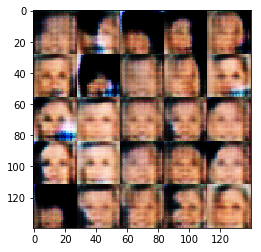

Epoch 1/2... iteration 310... Discriminator Loss: 0.9597... Generator Loss: 1.6070
Epoch 1/2... iteration 320... Discriminator Loss: 1.4181... Generator Loss: 0.8283
Epoch 1/2... iteration 330... Discriminator Loss: 1.6905... Generator Loss: 2.2125
Epoch 1/2... iteration 340... Discriminator Loss: 1.2165... Generator Loss: 1.7316
Epoch 1/2... iteration 350... Discriminator Loss: 1.3286... Generator Loss: 1.6024
Epoch 1/2... iteration 360... Discriminator Loss: 1.4242... Generator Loss: 1.6256
Epoch 1/2... iteration 370... Discriminator Loss: 1.4182... Generator Loss: 2.8166
Epoch 1/2... iteration 380... Discriminator Loss: 1.6716... Generator Loss: 1.3803
Epoch 1/2... iteration 390... Discriminator Loss: 1.2219... Generator Loss: 1.9069
Epoch 1/2... iteration 400... Discriminator Loss: 1.2573... Generator Loss: 1.1849


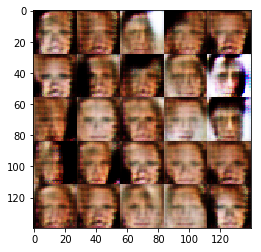

Epoch 1/2... iteration 410... Discriminator Loss: 1.4172... Generator Loss: 1.8685
Epoch 1/2... iteration 420... Discriminator Loss: 1.3008... Generator Loss: 1.3151
Epoch 1/2... iteration 430... Discriminator Loss: 2.8297... Generator Loss: 2.6389
Epoch 1/2... iteration 440... Discriminator Loss: 1.9467... Generator Loss: 1.4544
Epoch 1/2... iteration 450... Discriminator Loss: 1.2612... Generator Loss: 1.0105
Epoch 1/2... iteration 460... Discriminator Loss: 1.4063... Generator Loss: 1.3729
Epoch 1/2... iteration 470... Discriminator Loss: 1.1156... Generator Loss: 1.8281
Epoch 1/2... iteration 480... Discriminator Loss: 1.3898... Generator Loss: 1.8049
Epoch 1/2... iteration 490... Discriminator Loss: 1.2222... Generator Loss: 1.2175
Epoch 1/2... iteration 500... Discriminator Loss: 1.1078... Generator Loss: 2.6369


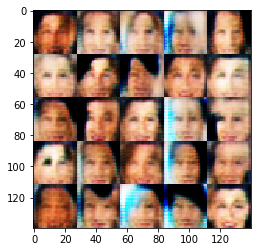

Epoch 1/2... iteration 510... Discriminator Loss: 1.5457... Generator Loss: 2.5346
Epoch 1/2... iteration 520... Discriminator Loss: 2.2014... Generator Loss: 1.4463
Epoch 1/2... iteration 530... Discriminator Loss: 1.2826... Generator Loss: 0.8985
Epoch 1/2... iteration 540... Discriminator Loss: 1.4595... Generator Loss: 1.0641
Epoch 1/2... iteration 550... Discriminator Loss: 1.2461... Generator Loss: 1.5294
Epoch 1/2... iteration 560... Discriminator Loss: 1.2139... Generator Loss: 1.3753
Epoch 1/2... iteration 570... Discriminator Loss: 0.9564... Generator Loss: 1.8930
Epoch 1/2... iteration 580... Discriminator Loss: 1.1875... Generator Loss: 1.8189
Epoch 1/2... iteration 590... Discriminator Loss: 1.1898... Generator Loss: 2.0261
Epoch 1/2... iteration 600... Discriminator Loss: 1.3457... Generator Loss: 0.9881


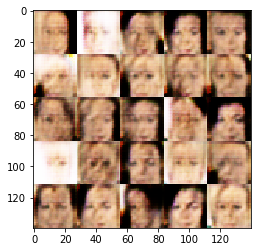

Epoch 1/2... iteration 610... Discriminator Loss: 1.7230... Generator Loss: 0.9128
Epoch 1/2... iteration 620... Discriminator Loss: 1.4189... Generator Loss: 4.6026
Epoch 1/2... iteration 630... Discriminator Loss: 1.7155... Generator Loss: 1.8437
Epoch 1/2... iteration 640... Discriminator Loss: 1.2220... Generator Loss: 1.2744
Epoch 1/2... iteration 650... Discriminator Loss: 1.3912... Generator Loss: 1.6153
Epoch 1/2... iteration 660... Discriminator Loss: 2.6767... Generator Loss: 2.9535
Epoch 1/2... iteration 670... Discriminator Loss: 1.2902... Generator Loss: 2.0359
Epoch 1/2... iteration 680... Discriminator Loss: 1.3741... Generator Loss: 3.4003
Epoch 1/2... iteration 690... Discriminator Loss: 1.2609... Generator Loss: 2.5671
Epoch 1/2... iteration 700... Discriminator Loss: 1.2739... Generator Loss: 1.5071


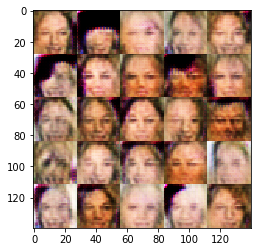

Epoch 1/2... iteration 710... Discriminator Loss: 1.7420... Generator Loss: 1.2501
Epoch 1/2... iteration 720... Discriminator Loss: 1.5889... Generator Loss: 1.4657
Epoch 1/2... iteration 730... Discriminator Loss: 1.4158... Generator Loss: 1.9832
Epoch 1/2... iteration 740... Discriminator Loss: 1.3090... Generator Loss: 6.0132
Epoch 1/2... iteration 750... Discriminator Loss: 1.5013... Generator Loss: 1.2270
Epoch 1/2... iteration 760... Discriminator Loss: 1.0364... Generator Loss: 1.2704
Epoch 1/2... iteration 770... Discriminator Loss: 1.2752... Generator Loss: 1.0703
Epoch 1/2... iteration 780... Discriminator Loss: 1.2917... Generator Loss: 3.1933
Epoch 1/2... iteration 790... Discriminator Loss: 0.9185... Generator Loss: 2.2967
Epoch 1/2... iteration 800... Discriminator Loss: 0.9705... Generator Loss: 1.3694


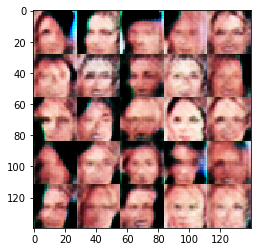

Epoch 1/2... iteration 810... Discriminator Loss: 2.2003... Generator Loss: 1.3286
Epoch 1/2... iteration 820... Discriminator Loss: 1.5184... Generator Loss: 1.6767
Epoch 1/2... iteration 830... Discriminator Loss: 1.4307... Generator Loss: 1.0363
Epoch 1/2... iteration 840... Discriminator Loss: 1.5360... Generator Loss: 1.4490
Epoch 1/2... iteration 850... Discriminator Loss: 1.1124... Generator Loss: 1.3706
Epoch 1/2... iteration 860... Discriminator Loss: 1.1938... Generator Loss: 1.4569
Epoch 1/2... iteration 870... Discriminator Loss: 1.7502... Generator Loss: 1.9146
Epoch 1/2... iteration 880... Discriminator Loss: 1.4573... Generator Loss: 1.7254
Epoch 1/2... iteration 890... Discriminator Loss: 1.3809... Generator Loss: 1.4008
Epoch 1/2... iteration 900... Discriminator Loss: 1.2946... Generator Loss: 1.3798


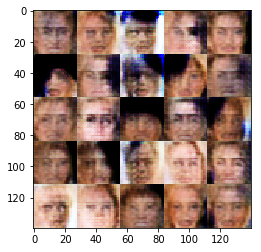

Epoch 1/2... iteration 910... Discriminator Loss: 1.2257... Generator Loss: 1.3729
Epoch 1/2... iteration 920... Discriminator Loss: 1.3211... Generator Loss: 0.9831
Epoch 1/2... iteration 930... Discriminator Loss: 1.3133... Generator Loss: 2.4059
Epoch 1/2... iteration 940... Discriminator Loss: 1.4285... Generator Loss: 1.4034
Epoch 1/2... iteration 950... Discriminator Loss: 1.9981... Generator Loss: 6.9551
Epoch 1/2... iteration 960... Discriminator Loss: 1.5653... Generator Loss: 1.1869
Epoch 1/2... iteration 970... Discriminator Loss: 1.5743... Generator Loss: 1.5056
Epoch 1/2... iteration 980... Discriminator Loss: 1.9649... Generator Loss: 3.6986
Epoch 1/2... iteration 990... Discriminator Loss: 1.3582... Generator Loss: 1.5695
Epoch 1/2... iteration 1000... Discriminator Loss: 1.8234... Generator Loss: 2.3965


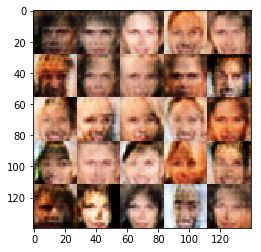

Epoch 1/2... iteration 1010... Discriminator Loss: 1.1781... Generator Loss: 1.7926
Epoch 1/2... iteration 1020... Discriminator Loss: 1.1753... Generator Loss: 1.4694
Epoch 1/2... iteration 1030... Discriminator Loss: 1.5705... Generator Loss: 1.2519
Epoch 1/2... iteration 1040... Discriminator Loss: 1.1867... Generator Loss: 1.9170
Epoch 1/2... iteration 1050... Discriminator Loss: 1.1366... Generator Loss: 1.6793
Epoch 1/2... iteration 1060... Discriminator Loss: 1.6385... Generator Loss: 1.0348
Epoch 1/2... iteration 1070... Discriminator Loss: 1.4607... Generator Loss: 1.2232
Epoch 1/2... iteration 1080... Discriminator Loss: 1.6810... Generator Loss: 0.9859
Epoch 1/2... iteration 1090... Discriminator Loss: 1.2819... Generator Loss: 1.5181
Epoch 1/2... iteration 1100... Discriminator Loss: 1.5763... Generator Loss: 1.4466


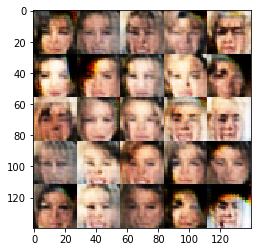

Epoch 1/2... iteration 1110... Discriminator Loss: 1.2642... Generator Loss: 1.5720
Epoch 1/2... iteration 1120... Discriminator Loss: 1.4484... Generator Loss: 1.8639
Epoch 1/2... iteration 1130... Discriminator Loss: 1.2847... Generator Loss: 1.3701
Epoch 1/2... iteration 1140... Discriminator Loss: 1.3977... Generator Loss: 1.7675
Epoch 1/2... iteration 1150... Discriminator Loss: 1.4376... Generator Loss: 1.4163
Epoch 1/2... iteration 1160... Discriminator Loss: 1.3821... Generator Loss: 1.4977
Epoch 1/2... iteration 1170... Discriminator Loss: 1.5723... Generator Loss: 3.1798
Epoch 1/2... iteration 1180... Discriminator Loss: 1.4525... Generator Loss: 1.9306
Epoch 1/2... iteration 1190... Discriminator Loss: 1.4264... Generator Loss: 3.8832
Epoch 1/2... iteration 1200... Discriminator Loss: 1.2570... Generator Loss: 1.5053


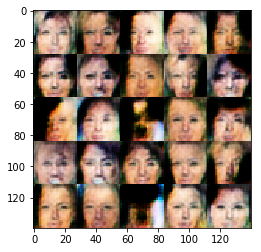

Epoch 1/2... iteration 1210... Discriminator Loss: 1.2941... Generator Loss: 0.8472
Epoch 1/2... iteration 1220... Discriminator Loss: 0.6864... Generator Loss: 2.7994
Epoch 1/2... iteration 1230... Discriminator Loss: 0.8348... Generator Loss: 2.9530
Epoch 1/2... iteration 1240... Discriminator Loss: 0.6096... Generator Loss: 4.1559
Epoch 1/2... iteration 1250... Discriminator Loss: 0.4737... Generator Loss: 4.7572
Epoch 1/2... iteration 1260... Discriminator Loss: 0.5215... Generator Loss: 4.3122
Epoch 1/2... iteration 1270... Discriminator Loss: 0.4908... Generator Loss: 4.9433
Epoch 1/2... iteration 1280... Discriminator Loss: 0.4756... Generator Loss: 5.9503
Epoch 1/2... iteration 1290... Discriminator Loss: 0.7178... Generator Loss: 3.1071
Epoch 1/2... iteration 1300... Discriminator Loss: 0.4672... Generator Loss: 5.4920


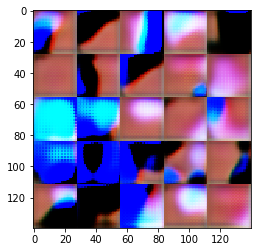

Epoch 1/2... iteration 1310... Discriminator Loss: 0.5148... Generator Loss: 3.2003
Epoch 1/2... iteration 1320... Discriminator Loss: 0.5770... Generator Loss: 4.1144
Epoch 1/2... iteration 1330... Discriminator Loss: 0.6474... Generator Loss: 3.8703
Epoch 1/2... iteration 1340... Discriminator Loss: 0.6387... Generator Loss: 2.7777
Epoch 1/2... iteration 1350... Discriminator Loss: 0.5158... Generator Loss: 3.2019
Epoch 1/2... iteration 1360... Discriminator Loss: 0.6468... Generator Loss: 2.4960
Epoch 1/2... iteration 1370... Discriminator Loss: 0.8513... Generator Loss: 1.8426
Epoch 1/2... iteration 1380... Discriminator Loss: 1.0611... Generator Loss: 1.7124
Epoch 1/2... iteration 1390... Discriminator Loss: 0.7582... Generator Loss: 2.3235
Epoch 1/2... iteration 1400... Discriminator Loss: 0.7468... Generator Loss: 3.4953


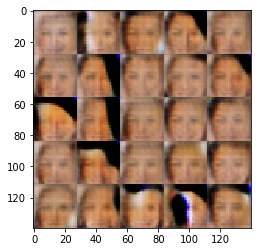

Epoch 1/2... iteration 1410... Discriminator Loss: 0.8960... Generator Loss: 3.7053
Epoch 1/2... iteration 1420... Discriminator Loss: 3.5117... Generator Loss: 4.4259
Epoch 1/2... iteration 1430... Discriminator Loss: 0.8230... Generator Loss: 3.7515
Epoch 1/2... iteration 1440... Discriminator Loss: 0.9974... Generator Loss: 1.9887
Epoch 1/2... iteration 1450... Discriminator Loss: 0.8869... Generator Loss: 2.4368
Epoch 1/2... iteration 1460... Discriminator Loss: 1.6172... Generator Loss: 8.5908
Epoch 1/2... iteration 1470... Discriminator Loss: 1.1088... Generator Loss: 4.0902
Epoch 1/2... iteration 1480... Discriminator Loss: 1.1876... Generator Loss: 1.3289
Epoch 1/2... iteration 1490... Discriminator Loss: 0.6810... Generator Loss: 2.6681
Epoch 1/2... iteration 1500... Discriminator Loss: 0.8819... Generator Loss: 2.9775


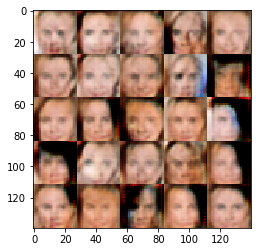

Epoch 1/2... iteration 1510... Discriminator Loss: 1.1806... Generator Loss: 1.3754
Epoch 1/2... iteration 1520... Discriminator Loss: 1.1818... Generator Loss: 3.2088
Epoch 1/2... iteration 1530... Discriminator Loss: 1.5514... Generator Loss: 8.9431
Epoch 1/2... iteration 1540... Discriminator Loss: 1.4406... Generator Loss: 1.5665
Epoch 1/2... iteration 1550... Discriminator Loss: 1.9207... Generator Loss: 1.0553
Epoch 1/2... iteration 1560... Discriminator Loss: 1.0802... Generator Loss: 1.9255
Epoch 1/2... iteration 1570... Discriminator Loss: 1.5966... Generator Loss: 3.5502
Epoch 1/2... iteration 1580... Discriminator Loss: 1.3427... Generator Loss: 3.1230
Epoch 1/2... iteration 1590... Discriminator Loss: 1.0974... Generator Loss: 2.3495
Epoch 1/2... iteration 1600... Discriminator Loss: 1.1255... Generator Loss: 3.3567


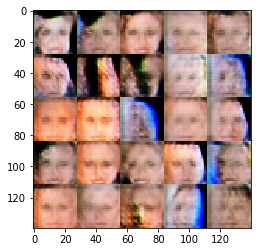

Epoch 1/2... iteration 1610... Discriminator Loss: 1.0506... Generator Loss: 4.0744
Epoch 1/2... iteration 1620... Discriminator Loss: 1.9162... Generator Loss: 1.9644
Epoch 1/2... iteration 1630... Discriminator Loss: 2.1144... Generator Loss: 10.7659
Epoch 1/2... iteration 1640... Discriminator Loss: 2.4792... Generator Loss: 1.9785
Epoch 1/2... iteration 1650... Discriminator Loss: 1.1794... Generator Loss: 3.6418
Epoch 1/2... iteration 1660... Discriminator Loss: 1.2351... Generator Loss: 5.3203
Epoch 1/2... iteration 1670... Discriminator Loss: 1.1434... Generator Loss: 3.0215
Epoch 1/2... iteration 1680... Discriminator Loss: 1.1847... Generator Loss: 3.1740
Epoch 1/2... iteration 1690... Discriminator Loss: 1.4391... Generator Loss: 2.9917
Epoch 1/2... iteration 1700... Discriminator Loss: 1.3971... Generator Loss: 1.6403


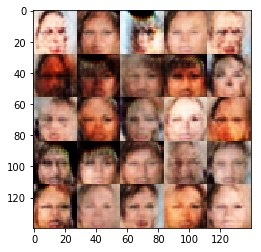

Epoch 1/2... iteration 1710... Discriminator Loss: 1.2990... Generator Loss: 2.0173
Epoch 1/2... iteration 1720... Discriminator Loss: 1.3457... Generator Loss: 1.4813
Epoch 1/2... iteration 1730... Discriminator Loss: 1.4485... Generator Loss: 1.3647
Epoch 1/2... iteration 1740... Discriminator Loss: 1.1312... Generator Loss: 1.3663
Epoch 1/2... iteration 1750... Discriminator Loss: 1.2332... Generator Loss: 1.8754
Epoch 1/2... iteration 1760... Discriminator Loss: 1.7400... Generator Loss: 5.0901
Epoch 1/2... iteration 1770... Discriminator Loss: 1.2125... Generator Loss: 1.0719
Epoch 1/2... iteration 1780... Discriminator Loss: 1.5228... Generator Loss: 1.8723
Epoch 1/2... iteration 1790... Discriminator Loss: 1.1415... Generator Loss: 3.1333
Epoch 1/2... iteration 1800... Discriminator Loss: 1.6146... Generator Loss: 0.2511


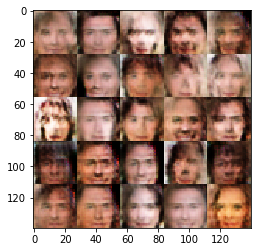

Epoch 1/2... iteration 1810... Discriminator Loss: 1.1262... Generator Loss: 1.4382
Epoch 1/2... iteration 1820... Discriminator Loss: 1.1947... Generator Loss: 1.5410
Epoch 1/2... iteration 1830... Discriminator Loss: 1.4461... Generator Loss: 1.3828
Epoch 1/2... iteration 1840... Discriminator Loss: 1.2551... Generator Loss: 0.9705
Epoch 1/2... iteration 1850... Discriminator Loss: 1.6063... Generator Loss: 2.4527
Epoch 1/2... iteration 1860... Discriminator Loss: 1.4799... Generator Loss: 2.3441
Epoch 1/2... iteration 1870... Discriminator Loss: 1.5543... Generator Loss: 2.6397
Epoch 1/2... iteration 1880... Discriminator Loss: 1.3352... Generator Loss: 1.3614
Epoch 1/2... iteration 1890... Discriminator Loss: 1.3003... Generator Loss: 1.5494
Epoch 1/2... iteration 1900... Discriminator Loss: 1.2342... Generator Loss: 2.0623


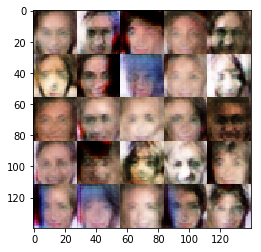

Epoch 1/2... iteration 1910... Discriminator Loss: 1.3073... Generator Loss: 1.7747
Epoch 1/2... iteration 1920... Discriminator Loss: 1.3284... Generator Loss: 3.0411
Epoch 1/2... iteration 1930... Discriminator Loss: 1.4373... Generator Loss: 3.8629
Epoch 1/2... iteration 1940... Discriminator Loss: 2.5878... Generator Loss: 8.5984
Epoch 1/2... iteration 1950... Discriminator Loss: 2.1498... Generator Loss: 0.7417
Epoch 1/2... iteration 1960... Discriminator Loss: 1.5387... Generator Loss: 1.1338
Epoch 1/2... iteration 1970... Discriminator Loss: 1.4344... Generator Loss: 2.0719
Epoch 1/2... iteration 1980... Discriminator Loss: 1.5387... Generator Loss: 2.5668
Epoch 1/2... iteration 1990... Discriminator Loss: 1.1116... Generator Loss: 2.2671
Epoch 1/2... iteration 2000... Discriminator Loss: 1.5114... Generator Loss: 1.6484


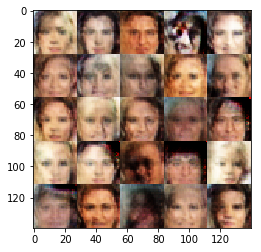

Epoch 1/2... iteration 2010... Discriminator Loss: 1.2189... Generator Loss: 2.0230
Epoch 1/2... iteration 2020... Discriminator Loss: 1.0653... Generator Loss: 1.8409
Epoch 1/2... iteration 2030... Discriminator Loss: 1.2619... Generator Loss: 1.6217
Epoch 1/2... iteration 2040... Discriminator Loss: 1.3355... Generator Loss: 1.3653
Epoch 1/2... iteration 2050... Discriminator Loss: 0.9691... Generator Loss: 2.0805
Epoch 1/2... iteration 2060... Discriminator Loss: 1.2951... Generator Loss: 1.4723
Epoch 1/2... iteration 2070... Discriminator Loss: 1.3148... Generator Loss: 1.4973
Epoch 1/2... iteration 2080... Discriminator Loss: 1.4293... Generator Loss: 1.5724
Epoch 1/2... iteration 2090... Discriminator Loss: 1.1840... Generator Loss: 1.2415
Epoch 1/2... iteration 2100... Discriminator Loss: 1.3786... Generator Loss: 1.4028


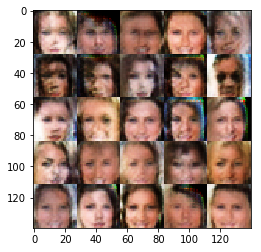

Epoch 1/2... iteration 2110... Discriminator Loss: 1.1505... Generator Loss: 1.4973
Epoch 1/2... iteration 2120... Discriminator Loss: 1.3327... Generator Loss: 2.4839
Epoch 1/2... iteration 2130... Discriminator Loss: 1.3936... Generator Loss: 1.6468
Epoch 1/2... iteration 2140... Discriminator Loss: 1.4815... Generator Loss: 1.2846
Epoch 1/2... iteration 2150... Discriminator Loss: 1.3189... Generator Loss: 1.6672
Epoch 1/2... iteration 2160... Discriminator Loss: 1.6147... Generator Loss: 2.6520
Epoch 1/2... iteration 2170... Discriminator Loss: 1.2442... Generator Loss: 1.4993
Epoch 1/2... iteration 2180... Discriminator Loss: 1.5200... Generator Loss: 1.5455
Epoch 1/2... iteration 2190... Discriminator Loss: 1.4002... Generator Loss: 2.2040
Epoch 1/2... iteration 2200... Discriminator Loss: 1.2336... Generator Loss: 1.7849


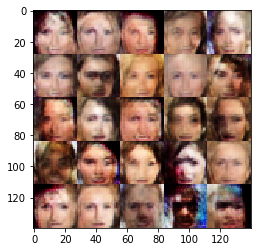

Epoch 1/2... iteration 2210... Discriminator Loss: 1.5636... Generator Loss: 3.4116
Epoch 1/2... iteration 2220... Discriminator Loss: 1.0781... Generator Loss: 1.7982
Epoch 1/2... iteration 2230... Discriminator Loss: 1.1958... Generator Loss: 1.5440
Epoch 1/2... iteration 2240... Discriminator Loss: 1.4791... Generator Loss: 1.9879
Epoch 1/2... iteration 2250... Discriminator Loss: 1.7386... Generator Loss: 0.8530
Epoch 1/2... iteration 2260... Discriminator Loss: 1.1895... Generator Loss: 1.3843
Epoch 1/2... iteration 2270... Discriminator Loss: 1.3946... Generator Loss: 1.1237
Epoch 1/2... iteration 2280... Discriminator Loss: 1.1837... Generator Loss: 1.9307
Epoch 1/2... iteration 2290... Discriminator Loss: 1.5737... Generator Loss: 2.8488
Epoch 1/2... iteration 2300... Discriminator Loss: 3.1200... Generator Loss: 1.9116


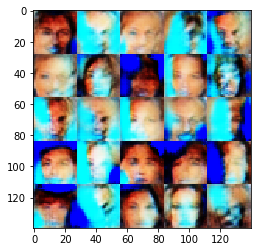

Epoch 1/2... iteration 2310... Discriminator Loss: 1.0395... Generator Loss: 2.1645
Epoch 1/2... iteration 2320... Discriminator Loss: 1.0954... Generator Loss: 1.9015
Epoch 1/2... iteration 2330... Discriminator Loss: 1.3759... Generator Loss: 1.6092
Epoch 1/2... iteration 2340... Discriminator Loss: 1.1871... Generator Loss: 1.5432
Epoch 1/2... iteration 2350... Discriminator Loss: 0.9327... Generator Loss: 1.4048
Epoch 1/2... iteration 2360... Discriminator Loss: 0.9820... Generator Loss: 1.6777
Epoch 1/2... iteration 2370... Discriminator Loss: 1.2542... Generator Loss: 2.2007
Epoch 1/2... iteration 2380... Discriminator Loss: 1.2481... Generator Loss: 1.2499
Epoch 1/2... iteration 2390... Discriminator Loss: 1.8076... Generator Loss: 2.7855
Epoch 1/2... iteration 2400... Discriminator Loss: 1.2687... Generator Loss: 1.5290


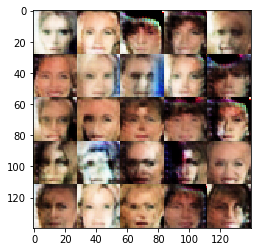

Epoch 1/2... iteration 2410... Discriminator Loss: 1.1983... Generator Loss: 1.7400
Epoch 1/2... iteration 2420... Discriminator Loss: 1.3455... Generator Loss: 1.1192
Epoch 1/2... iteration 2430... Discriminator Loss: 1.3014... Generator Loss: 1.5660
Epoch 1/2... iteration 2440... Discriminator Loss: 1.1828... Generator Loss: 1.2395
Epoch 1/2... iteration 2450... Discriminator Loss: 1.8006... Generator Loss: 3.0369
Epoch 1/2... iteration 2460... Discriminator Loss: 1.2497... Generator Loss: 1.8858
Epoch 1/2... iteration 2470... Discriminator Loss: 1.4281... Generator Loss: 1.2760
Epoch 1/2... iteration 2480... Discriminator Loss: 1.3325... Generator Loss: 1.7718
Epoch 1/2... iteration 2490... Discriminator Loss: 1.2946... Generator Loss: 1.0223
Epoch 1/2... iteration 2500... Discriminator Loss: 1.5243... Generator Loss: 1.9817


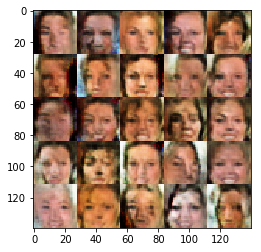

Epoch 1/2... iteration 2510... Discriminator Loss: 1.2353... Generator Loss: 3.5996
Epoch 1/2... iteration 2520... Discriminator Loss: 1.2137... Generator Loss: 1.5656
Epoch 1/2... iteration 2530... Discriminator Loss: 1.2939... Generator Loss: 1.5806
Epoch 1/2... iteration 2540... Discriminator Loss: 1.4440... Generator Loss: 1.4536
Epoch 1/2... iteration 2550... Discriminator Loss: 1.3448... Generator Loss: 1.1662
Epoch 1/2... iteration 2560... Discriminator Loss: 1.3488... Generator Loss: 1.3764
Epoch 1/2... iteration 2570... Discriminator Loss: 1.0468... Generator Loss: 1.9953
Epoch 1/2... iteration 2580... Discriminator Loss: 1.5752... Generator Loss: 1.4276
Epoch 1/2... iteration 2590... Discriminator Loss: 1.3568... Generator Loss: 1.2902
Epoch 1/2... iteration 2600... Discriminator Loss: 1.3154... Generator Loss: 1.4822


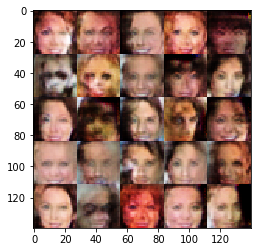

Epoch 1/2... iteration 2610... Discriminator Loss: 1.1639... Generator Loss: 1.2536
Epoch 1/2... iteration 2620... Discriminator Loss: 1.1694... Generator Loss: 1.6939
Epoch 1/2... iteration 2630... Discriminator Loss: 1.1882... Generator Loss: 1.3113
Epoch 1/2... iteration 2640... Discriminator Loss: 1.3577... Generator Loss: 1.3551
Epoch 1/2... iteration 2650... Discriminator Loss: 1.1883... Generator Loss: 1.3934
Epoch 1/2... iteration 2660... Discriminator Loss: 1.2028... Generator Loss: 2.7325
Epoch 1/2... iteration 2670... Discriminator Loss: 1.3179... Generator Loss: 2.6142
Epoch 1/2... iteration 2680... Discriminator Loss: 1.2739... Generator Loss: 1.4379
Epoch 1/2... iteration 2690... Discriminator Loss: 1.0896... Generator Loss: 1.4592
Epoch 1/2... iteration 2700... Discriminator Loss: 1.5379... Generator Loss: 2.8595


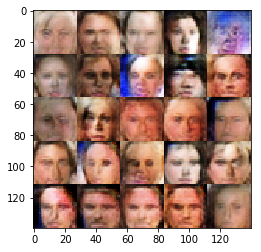

Epoch 1/2... iteration 2710... Discriminator Loss: 1.2613... Generator Loss: 1.5661
Epoch 1/2... iteration 2720... Discriminator Loss: 1.1961... Generator Loss: 1.6668
Epoch 1/2... iteration 2730... Discriminator Loss: 1.1828... Generator Loss: 1.5579
Epoch 1/2... iteration 2740... Discriminator Loss: 1.2769... Generator Loss: 1.6123
Epoch 1/2... iteration 2750... Discriminator Loss: 1.3704... Generator Loss: 2.3601
Epoch 1/2... iteration 2760... Discriminator Loss: 1.8531... Generator Loss: 1.0753
Epoch 1/2... iteration 2770... Discriminator Loss: 1.4679... Generator Loss: 2.2557
Epoch 1/2... iteration 2780... Discriminator Loss: 1.3394... Generator Loss: 1.2364
Epoch 1/2... iteration 2790... Discriminator Loss: 1.4238... Generator Loss: 1.4873
Epoch 1/2... iteration 2800... Discriminator Loss: 1.3386... Generator Loss: 2.0551


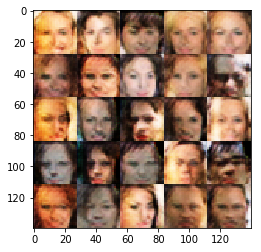

Epoch 1/2... iteration 2810... Discriminator Loss: 2.8074... Generator Loss: 0.7970
Epoch 1/2... iteration 2820... Discriminator Loss: 1.5555... Generator Loss: 2.2110
Epoch 1/2... iteration 2830... Discriminator Loss: 1.2149... Generator Loss: 1.7857
Epoch 1/2... iteration 2840... Discriminator Loss: 1.2906... Generator Loss: 1.4747
Epoch 1/2... iteration 2850... Discriminator Loss: 1.2642... Generator Loss: 1.3129
Epoch 1/2... iteration 2860... Discriminator Loss: 1.2205... Generator Loss: 1.5411
Epoch 1/2... iteration 2870... Discriminator Loss: 1.1037... Generator Loss: 1.5630
Epoch 1/2... iteration 2880... Discriminator Loss: 1.4851... Generator Loss: 1.4253
Epoch 1/2... iteration 2890... Discriminator Loss: 1.2523... Generator Loss: 1.5668
Epoch 1/2... iteration 2900... Discriminator Loss: 1.2000... Generator Loss: 1.8566


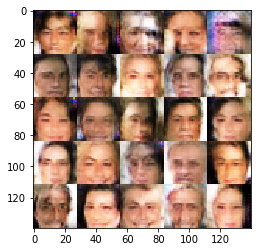

Epoch 1/2... iteration 2910... Discriminator Loss: 1.2349... Generator Loss: 1.8539
Epoch 1/2... iteration 2920... Discriminator Loss: 1.7344... Generator Loss: 1.7880
Epoch 1/2... iteration 2930... Discriminator Loss: 1.2984... Generator Loss: 1.6572
Epoch 1/2... iteration 2940... Discriminator Loss: 1.1091... Generator Loss: 1.8243
Epoch 1/2... iteration 2950... Discriminator Loss: 1.7303... Generator Loss: 3.1599
Epoch 1/2... iteration 2960... Discriminator Loss: 1.5374... Generator Loss: 1.2980
Epoch 1/2... iteration 2970... Discriminator Loss: 1.3911... Generator Loss: 2.3106
Epoch 1/2... iteration 2980... Discriminator Loss: 1.3137... Generator Loss: 2.6351
Epoch 1/2... iteration 2990... Discriminator Loss: 1.0862... Generator Loss: 1.5204
Epoch 1/2... iteration 3000... Discriminator Loss: 1.0342... Generator Loss: 1.4012


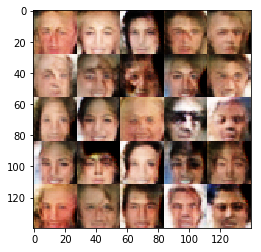

Epoch 1/2... iteration 3010... Discriminator Loss: 1.3256... Generator Loss: 1.2014
Epoch 1/2... iteration 3020... Discriminator Loss: 1.3442... Generator Loss: 1.1820
Epoch 1/2... iteration 3030... Discriminator Loss: 1.1556... Generator Loss: 1.3114
Epoch 1/2... iteration 3040... Discriminator Loss: 1.1787... Generator Loss: 2.5544
Epoch 1/2... iteration 3050... Discriminator Loss: 1.1314... Generator Loss: 1.4517
Epoch 1/2... iteration 3060... Discriminator Loss: 1.2481... Generator Loss: 1.3274
Epoch 1/2... iteration 3070... Discriminator Loss: 1.7084... Generator Loss: 3.1186
Epoch 1/2... iteration 3080... Discriminator Loss: 1.4470... Generator Loss: 2.2311
Epoch 1/2... iteration 3090... Discriminator Loss: 1.2089... Generator Loss: 1.4786
Epoch 1/2... iteration 3100... Discriminator Loss: 1.2816... Generator Loss: 1.5637


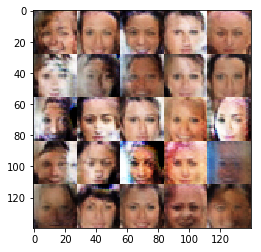

Epoch 1/2... iteration 3110... Discriminator Loss: 1.6903... Generator Loss: 1.6404
Epoch 1/2... iteration 3120... Discriminator Loss: 1.6237... Generator Loss: 5.1541
Epoch 1/2... iteration 3130... Discriminator Loss: 1.4305... Generator Loss: 1.4586
Epoch 1/2... iteration 3140... Discriminator Loss: 1.3453... Generator Loss: 1.6623
Epoch 1/2... iteration 3150... Discriminator Loss: 1.4670... Generator Loss: 1.1662
Epoch 1/2... iteration 3160... Discriminator Loss: 1.3892... Generator Loss: 1.0613
Epoch 2/2... iteration 10... Discriminator Loss: 1.3319... Generator Loss: 2.1091
Epoch 2/2... iteration 20... Discriminator Loss: 1.0722... Generator Loss: 1.8341
Epoch 2/2... iteration 30... Discriminator Loss: 1.0419... Generator Loss: 1.4091
Epoch 2/2... iteration 40... Discriminator Loss: 1.3622... Generator Loss: 1.3662
Epoch 2/2... iteration 50... Discriminator Loss: 1.1773... Generator Loss: 1.4685
Epoch 2/2... iteration 60... Discriminator Loss: 1.2631... Generator Loss: 1.6189
Epoc

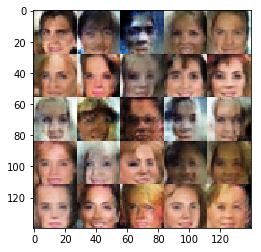

Epoch 2/2... iteration 110... Discriminator Loss: 1.4719... Generator Loss: 1.9012
Epoch 2/2... iteration 120... Discriminator Loss: 1.1966... Generator Loss: 1.3219
Epoch 2/2... iteration 130... Discriminator Loss: 1.3124... Generator Loss: 1.3358
Epoch 2/2... iteration 140... Discriminator Loss: 1.3390... Generator Loss: 1.5125
Epoch 2/2... iteration 150... Discriminator Loss: 1.3394... Generator Loss: 2.1960
Epoch 2/2... iteration 160... Discriminator Loss: 1.3105... Generator Loss: 1.2623
Epoch 2/2... iteration 170... Discriminator Loss: 1.4314... Generator Loss: 1.1722
Epoch 2/2... iteration 180... Discriminator Loss: 1.4866... Generator Loss: 1.5069
Epoch 2/2... iteration 190... Discriminator Loss: 1.3233... Generator Loss: 2.1335
Epoch 2/2... iteration 200... Discriminator Loss: 1.1901... Generator Loss: 1.2424


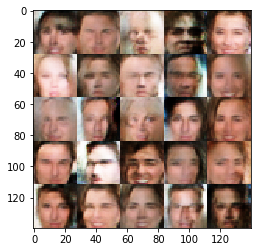

Epoch 2/2... iteration 210... Discriminator Loss: 1.3800... Generator Loss: 1.2758
Epoch 2/2... iteration 220... Discriminator Loss: 1.2182... Generator Loss: 1.4058
Epoch 2/2... iteration 230... Discriminator Loss: 1.2585... Generator Loss: 1.9614
Epoch 2/2... iteration 240... Discriminator Loss: 2.0296... Generator Loss: 4.6132
Epoch 2/2... iteration 250... Discriminator Loss: 1.2459... Generator Loss: 1.3527
Epoch 2/2... iteration 260... Discriminator Loss: 1.3413... Generator Loss: 1.6867
Epoch 2/2... iteration 270... Discriminator Loss: 1.3032... Generator Loss: 1.1292
Epoch 2/2... iteration 280... Discriminator Loss: 1.0840... Generator Loss: 1.8020
Epoch 2/2... iteration 290... Discriminator Loss: 1.2851... Generator Loss: 1.4095
Epoch 2/2... iteration 300... Discriminator Loss: 1.2761... Generator Loss: 1.5826


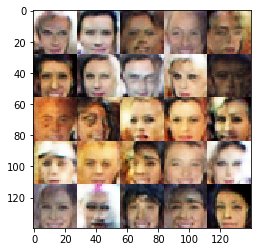

Epoch 2/2... iteration 310... Discriminator Loss: 1.2365... Generator Loss: 1.3475
Epoch 2/2... iteration 320... Discriminator Loss: 1.3123... Generator Loss: 1.7297
Epoch 2/2... iteration 330... Discriminator Loss: 1.3591... Generator Loss: 1.1267
Epoch 2/2... iteration 340... Discriminator Loss: 1.3290... Generator Loss: 1.6229
Epoch 2/2... iteration 350... Discriminator Loss: 1.1955... Generator Loss: 1.4332
Epoch 2/2... iteration 360... Discriminator Loss: 1.2836... Generator Loss: 1.4890
Epoch 2/2... iteration 370... Discriminator Loss: 1.3626... Generator Loss: 1.4020
Epoch 2/2... iteration 380... Discriminator Loss: 1.1695... Generator Loss: 1.7002
Epoch 2/2... iteration 390... Discriminator Loss: 1.3314... Generator Loss: 1.3369
Epoch 2/2... iteration 400... Discriminator Loss: 1.3416... Generator Loss: 1.3368


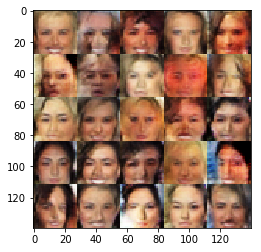

Epoch 2/2... iteration 410... Discriminator Loss: 1.3724... Generator Loss: 1.5355
Epoch 2/2... iteration 420... Discriminator Loss: 1.6467... Generator Loss: 2.9475
Epoch 2/2... iteration 430... Discriminator Loss: 1.2534... Generator Loss: 1.5154
Epoch 2/2... iteration 440... Discriminator Loss: 1.2906... Generator Loss: 1.2573
Epoch 2/2... iteration 450... Discriminator Loss: 1.3064... Generator Loss: 1.5560
Epoch 2/2... iteration 460... Discriminator Loss: 1.3335... Generator Loss: 1.8158
Epoch 2/2... iteration 470... Discriminator Loss: 1.2054... Generator Loss: 1.5770
Epoch 2/2... iteration 480... Discriminator Loss: 0.9781... Generator Loss: 1.1513
Epoch 2/2... iteration 490... Discriminator Loss: 1.5274... Generator Loss: 1.6403
Epoch 2/2... iteration 500... Discriminator Loss: 1.4292... Generator Loss: 1.4965


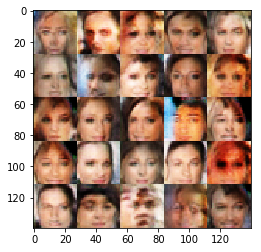

Epoch 2/2... iteration 510... Discriminator Loss: 2.1499... Generator Loss: 1.4848
Epoch 2/2... iteration 520... Discriminator Loss: 1.1595... Generator Loss: 1.3763
Epoch 2/2... iteration 530... Discriminator Loss: 1.3306... Generator Loss: 1.2968
Epoch 2/2... iteration 540... Discriminator Loss: 1.3004... Generator Loss: 1.4230
Epoch 2/2... iteration 550... Discriminator Loss: 1.2332... Generator Loss: 1.1896
Epoch 2/2... iteration 560... Discriminator Loss: 1.3325... Generator Loss: 1.3609
Epoch 2/2... iteration 570... Discriminator Loss: 1.3559... Generator Loss: 1.4387
Epoch 2/2... iteration 580... Discriminator Loss: 1.3307... Generator Loss: 1.8987
Epoch 2/2... iteration 590... Discriminator Loss: 1.3863... Generator Loss: 2.0031
Epoch 2/2... iteration 600... Discriminator Loss: 1.2159... Generator Loss: 1.4480


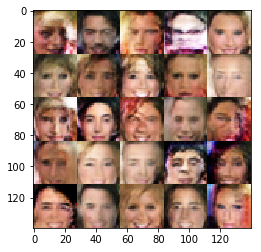

Epoch 2/2... iteration 610... Discriminator Loss: 1.1418... Generator Loss: 1.2850
Epoch 2/2... iteration 620... Discriminator Loss: 1.1012... Generator Loss: 1.3726
Epoch 2/2... iteration 630... Discriminator Loss: 1.2581... Generator Loss: 1.8813
Epoch 2/2... iteration 640... Discriminator Loss: 1.3555... Generator Loss: 1.1173
Epoch 2/2... iteration 650... Discriminator Loss: 1.0683... Generator Loss: 1.7666
Epoch 2/2... iteration 660... Discriminator Loss: 0.9578... Generator Loss: 1.6452
Epoch 2/2... iteration 670... Discriminator Loss: 1.3812... Generator Loss: 1.6574
Epoch 2/2... iteration 680... Discriminator Loss: 1.2597... Generator Loss: 1.3833
Epoch 2/2... iteration 690... Discriminator Loss: 1.2471... Generator Loss: 2.3781
Epoch 2/2... iteration 700... Discriminator Loss: 1.3326... Generator Loss: 1.4508


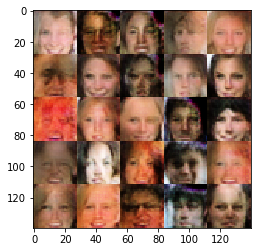

Epoch 2/2... iteration 710... Discriminator Loss: 1.3016... Generator Loss: 1.3326
Epoch 2/2... iteration 720... Discriminator Loss: 1.3842... Generator Loss: 1.7764
Epoch 2/2... iteration 730... Discriminator Loss: 1.3256... Generator Loss: 1.1615
Epoch 2/2... iteration 740... Discriminator Loss: 1.3115... Generator Loss: 1.5334
Epoch 2/2... iteration 750... Discriminator Loss: 1.1851... Generator Loss: 1.3479
Epoch 2/2... iteration 760... Discriminator Loss: 1.1916... Generator Loss: 1.0367
Epoch 2/2... iteration 770... Discriminator Loss: 1.2790... Generator Loss: 1.9600
Epoch 2/2... iteration 780... Discriminator Loss: 1.2121... Generator Loss: 1.8804
Epoch 2/2... iteration 790... Discriminator Loss: 1.0139... Generator Loss: 1.6103
Epoch 2/2... iteration 800... Discriminator Loss: 1.4032... Generator Loss: 1.5230


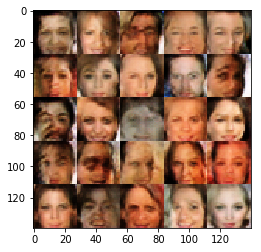

Epoch 2/2... iteration 810... Discriminator Loss: 1.2210... Generator Loss: 1.2119
Epoch 2/2... iteration 820... Discriminator Loss: 1.5751... Generator Loss: 2.4289
Epoch 2/2... iteration 830... Discriminator Loss: 1.3605... Generator Loss: 1.0796
Epoch 2/2... iteration 840... Discriminator Loss: 1.2854... Generator Loss: 1.3563
Epoch 2/2... iteration 850... Discriminator Loss: 1.2753... Generator Loss: 1.2727
Epoch 2/2... iteration 860... Discriminator Loss: 1.6967... Generator Loss: 0.8844
Epoch 2/2... iteration 870... Discriminator Loss: 1.2517... Generator Loss: 1.3093
Epoch 2/2... iteration 880... Discriminator Loss: 1.3492... Generator Loss: 1.7117
Epoch 2/2... iteration 890... Discriminator Loss: 1.2678... Generator Loss: 1.0709
Epoch 2/2... iteration 900... Discriminator Loss: 1.3674... Generator Loss: 1.3502


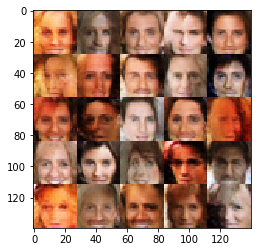

Epoch 2/2... iteration 910... Discriminator Loss: 1.3169... Generator Loss: 1.4712
Epoch 2/2... iteration 920... Discriminator Loss: 1.2450... Generator Loss: 1.4042
Epoch 2/2... iteration 930... Discriminator Loss: 1.2747... Generator Loss: 1.5396
Epoch 2/2... iteration 940... Discriminator Loss: 1.4840... Generator Loss: 1.4110
Epoch 2/2... iteration 950... Discriminator Loss: 1.2403... Generator Loss: 1.7935
Epoch 2/2... iteration 960... Discriminator Loss: 1.3094... Generator Loss: 1.4975
Epoch 2/2... iteration 970... Discriminator Loss: 1.3874... Generator Loss: 1.0156
Epoch 2/2... iteration 980... Discriminator Loss: 1.4482... Generator Loss: 1.3649
Epoch 2/2... iteration 990... Discriminator Loss: 1.2315... Generator Loss: 1.3486
Epoch 2/2... iteration 1000... Discriminator Loss: 1.7562... Generator Loss: 2.7577


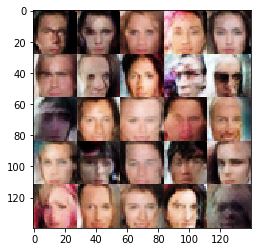

Epoch 2/2... iteration 1010... Discriminator Loss: 1.3921... Generator Loss: 1.4932
Epoch 2/2... iteration 1020... Discriminator Loss: 1.4442... Generator Loss: 1.1406
Epoch 2/2... iteration 1030... Discriminator Loss: 1.2729... Generator Loss: 1.3094
Epoch 2/2... iteration 1040... Discriminator Loss: 1.0875... Generator Loss: 1.4449
Epoch 2/2... iteration 1050... Discriminator Loss: 1.1623... Generator Loss: 1.4966
Epoch 2/2... iteration 1060... Discriminator Loss: 1.6896... Generator Loss: 1.2890
Epoch 2/2... iteration 1070... Discriminator Loss: 1.3276... Generator Loss: 2.3322
Epoch 2/2... iteration 1080... Discriminator Loss: 1.4545... Generator Loss: 1.1192
Epoch 2/2... iteration 1090... Discriminator Loss: 1.3175... Generator Loss: 1.3265
Epoch 2/2... iteration 1100... Discriminator Loss: 1.4773... Generator Loss: 1.3188


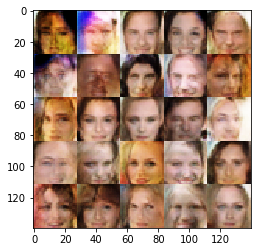

Epoch 2/2... iteration 1110... Discriminator Loss: 1.3870... Generator Loss: 1.1788
Epoch 2/2... iteration 1120... Discriminator Loss: 1.3421... Generator Loss: 1.5163
Epoch 2/2... iteration 1130... Discriminator Loss: 1.2010... Generator Loss: 1.1955
Epoch 2/2... iteration 1140... Discriminator Loss: 1.5442... Generator Loss: 1.4535
Epoch 2/2... iteration 1150... Discriminator Loss: 1.2674... Generator Loss: 1.4692
Epoch 2/2... iteration 1160... Discriminator Loss: 1.4766... Generator Loss: 1.6517
Epoch 2/2... iteration 1170... Discriminator Loss: 1.3010... Generator Loss: 1.1560
Epoch 2/2... iteration 1180... Discriminator Loss: 1.4416... Generator Loss: 1.1211
Epoch 2/2... iteration 1190... Discriminator Loss: 1.3471... Generator Loss: 1.5388
Epoch 2/2... iteration 1200... Discriminator Loss: 1.3658... Generator Loss: 1.5970


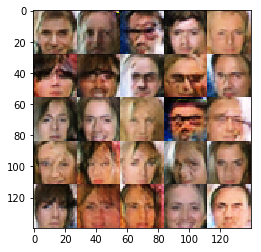

Epoch 2/2... iteration 1210... Discriminator Loss: 1.5571... Generator Loss: 1.1136
Epoch 2/2... iteration 1220... Discriminator Loss: 1.4772... Generator Loss: 1.2939
Epoch 2/2... iteration 1230... Discriminator Loss: 1.4659... Generator Loss: 0.9946
Epoch 2/2... iteration 1240... Discriminator Loss: 1.0712... Generator Loss: 1.5888
Epoch 2/2... iteration 1250... Discriminator Loss: 1.6663... Generator Loss: 0.8924
Epoch 2/2... iteration 1260... Discriminator Loss: 1.4416... Generator Loss: 2.5576
Epoch 2/2... iteration 1270... Discriminator Loss: 1.4866... Generator Loss: 1.2859
Epoch 2/2... iteration 1280... Discriminator Loss: 1.2327... Generator Loss: 1.4645
Epoch 2/2... iteration 1290... Discriminator Loss: 1.2292... Generator Loss: 1.4121
Epoch 2/2... iteration 1300... Discriminator Loss: 1.3333... Generator Loss: 2.3354


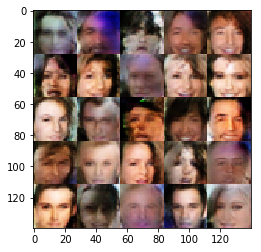

Epoch 2/2... iteration 1310... Discriminator Loss: 1.3813... Generator Loss: 1.2473
Epoch 2/2... iteration 1320... Discriminator Loss: 1.3786... Generator Loss: 2.5574
Epoch 2/2... iteration 1330... Discriminator Loss: 1.1614... Generator Loss: 1.7603
Epoch 2/2... iteration 1340... Discriminator Loss: 1.3551... Generator Loss: 1.1808
Epoch 2/2... iteration 1350... Discriminator Loss: 1.3688... Generator Loss: 1.1798
Epoch 2/2... iteration 1360... Discriminator Loss: 1.5104... Generator Loss: 1.3756
Epoch 2/2... iteration 1370... Discriminator Loss: 1.6021... Generator Loss: 1.8917
Epoch 2/2... iteration 1380... Discriminator Loss: 1.3073... Generator Loss: 1.2055
Epoch 2/2... iteration 1390... Discriminator Loss: 1.3399... Generator Loss: 1.5232
Epoch 2/2... iteration 1400... Discriminator Loss: 1.4173... Generator Loss: 1.1214


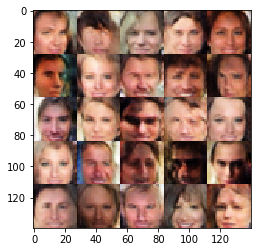

Epoch 2/2... iteration 1410... Discriminator Loss: 1.3104... Generator Loss: 1.3144
Epoch 2/2... iteration 1420... Discriminator Loss: 2.2749... Generator Loss: 3.8470
Epoch 2/2... iteration 1430... Discriminator Loss: 1.3206... Generator Loss: 1.5520
Epoch 2/2... iteration 1440... Discriminator Loss: 1.3434... Generator Loss: 1.2479
Epoch 2/2... iteration 1450... Discriminator Loss: 1.2754... Generator Loss: 1.1736
Epoch 2/2... iteration 1460... Discriminator Loss: 1.4187... Generator Loss: 1.1789
Epoch 2/2... iteration 1470... Discriminator Loss: 1.1989... Generator Loss: 1.2801
Epoch 2/2... iteration 1480... Discriminator Loss: 1.3479... Generator Loss: 1.3861
Epoch 2/2... iteration 1490... Discriminator Loss: 1.4125... Generator Loss: 1.2922
Epoch 2/2... iteration 1500... Discriminator Loss: 1.2862... Generator Loss: 1.3773


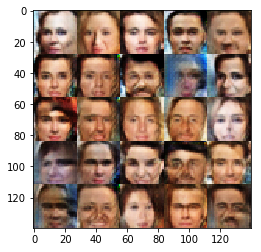

Epoch 2/2... iteration 1510... Discriminator Loss: 1.2656... Generator Loss: 1.5850
Epoch 2/2... iteration 1520... Discriminator Loss: 1.3861... Generator Loss: 1.4092
Epoch 2/2... iteration 1530... Discriminator Loss: 1.3958... Generator Loss: 1.8199
Epoch 2/2... iteration 1540... Discriminator Loss: 1.2994... Generator Loss: 1.2131
Epoch 2/2... iteration 1550... Discriminator Loss: 1.4029... Generator Loss: 1.0605
Epoch 2/2... iteration 1560... Discriminator Loss: 1.3208... Generator Loss: 1.5114
Epoch 2/2... iteration 1570... Discriminator Loss: 1.3016... Generator Loss: 1.4335
Epoch 2/2... iteration 1580... Discriminator Loss: 1.2933... Generator Loss: 1.1994
Epoch 2/2... iteration 1590... Discriminator Loss: 1.5949... Generator Loss: 1.2169
Epoch 2/2... iteration 1600... Discriminator Loss: 1.6218... Generator Loss: 1.7621


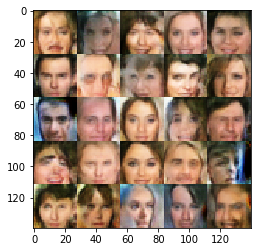

Epoch 2/2... iteration 1610... Discriminator Loss: 1.4278... Generator Loss: 1.5075
Epoch 2/2... iteration 1620... Discriminator Loss: 1.4988... Generator Loss: 1.4685
Epoch 2/2... iteration 1630... Discriminator Loss: 1.3653... Generator Loss: 1.1131
Epoch 2/2... iteration 1640... Discriminator Loss: 1.6848... Generator Loss: 2.9270
Epoch 2/2... iteration 1650... Discriminator Loss: 1.2569... Generator Loss: 1.2199
Epoch 2/2... iteration 1660... Discriminator Loss: 1.2210... Generator Loss: 1.1914
Epoch 2/2... iteration 1670... Discriminator Loss: 1.4927... Generator Loss: 1.1995
Epoch 2/2... iteration 1680... Discriminator Loss: 1.5086... Generator Loss: 0.8267
Epoch 2/2... iteration 1690... Discriminator Loss: 1.3386... Generator Loss: 1.6636
Epoch 2/2... iteration 1700... Discriminator Loss: 1.3137... Generator Loss: 1.4477


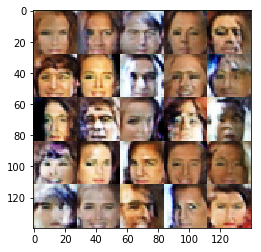

Epoch 2/2... iteration 1710... Discriminator Loss: 1.3218... Generator Loss: 1.1131
Epoch 2/2... iteration 1720... Discriminator Loss: 1.3301... Generator Loss: 1.1746
Epoch 2/2... iteration 1730... Discriminator Loss: 1.3824... Generator Loss: 1.2876
Epoch 2/2... iteration 1740... Discriminator Loss: 1.2275... Generator Loss: 1.1169
Epoch 2/2... iteration 1750... Discriminator Loss: 1.3741... Generator Loss: 1.1909
Epoch 2/2... iteration 1760... Discriminator Loss: 1.4410... Generator Loss: 1.0971
Epoch 2/2... iteration 1770... Discriminator Loss: 1.2451... Generator Loss: 1.2692
Epoch 2/2... iteration 1780... Discriminator Loss: 1.3903... Generator Loss: 1.0631
Epoch 2/2... iteration 1790... Discriminator Loss: 1.2236... Generator Loss: 1.3940
Epoch 2/2... iteration 1800... Discriminator Loss: 1.5374... Generator Loss: 0.8435


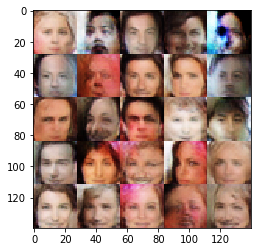

Epoch 2/2... iteration 1810... Discriminator Loss: 1.3203... Generator Loss: 2.3470
Epoch 2/2... iteration 1820... Discriminator Loss: 1.2736... Generator Loss: 1.1451
Epoch 2/2... iteration 1830... Discriminator Loss: 1.3910... Generator Loss: 1.0843
Epoch 2/2... iteration 1840... Discriminator Loss: 1.1487... Generator Loss: 1.3129
Epoch 2/2... iteration 1850... Discriminator Loss: 1.5895... Generator Loss: 1.7120
Epoch 2/2... iteration 1860... Discriminator Loss: 1.3800... Generator Loss: 1.0914
Epoch 2/2... iteration 1870... Discriminator Loss: 1.3796... Generator Loss: 1.1643
Epoch 2/2... iteration 1880... Discriminator Loss: 1.4937... Generator Loss: 0.9802
Epoch 2/2... iteration 1890... Discriminator Loss: 1.4151... Generator Loss: 1.3937
Epoch 2/2... iteration 1900... Discriminator Loss: 1.3459... Generator Loss: 1.4051


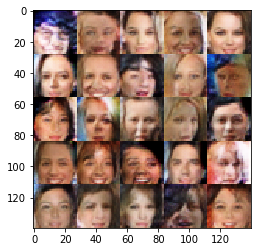

Epoch 2/2... iteration 1910... Discriminator Loss: 1.3787... Generator Loss: 1.2046
Epoch 2/2... iteration 1920... Discriminator Loss: 1.1773... Generator Loss: 1.6849
Epoch 2/2... iteration 1930... Discriminator Loss: 1.2750... Generator Loss: 1.3426
Epoch 2/2... iteration 1940... Discriminator Loss: 1.3365... Generator Loss: 1.1646
Epoch 2/2... iteration 1950... Discriminator Loss: 1.3247... Generator Loss: 1.1867
Epoch 2/2... iteration 1960... Discriminator Loss: 1.5791... Generator Loss: 0.8952
Epoch 2/2... iteration 1970... Discriminator Loss: 1.3035... Generator Loss: 1.4539
Epoch 2/2... iteration 1980... Discriminator Loss: 1.4495... Generator Loss: 1.2500
Epoch 2/2... iteration 1990... Discriminator Loss: 1.3073... Generator Loss: 1.4036
Epoch 2/2... iteration 2000... Discriminator Loss: 1.2896... Generator Loss: 1.3276


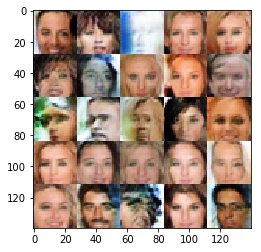

Epoch 2/2... iteration 2010... Discriminator Loss: 1.3310... Generator Loss: 1.0625
Epoch 2/2... iteration 2020... Discriminator Loss: 1.3727... Generator Loss: 2.0672
Epoch 2/2... iteration 2030... Discriminator Loss: 1.2415... Generator Loss: 1.2895
Epoch 2/2... iteration 2040... Discriminator Loss: 1.3302... Generator Loss: 1.3411
Epoch 2/2... iteration 2050... Discriminator Loss: 1.4424... Generator Loss: 1.0718
Epoch 2/2... iteration 2060... Discriminator Loss: 1.2667... Generator Loss: 1.1377
Epoch 2/2... iteration 2070... Discriminator Loss: 1.4083... Generator Loss: 1.0256
Epoch 2/2... iteration 2080... Discriminator Loss: 1.3436... Generator Loss: 1.1747
Epoch 2/2... iteration 2090... Discriminator Loss: 1.3276... Generator Loss: 1.1495
Epoch 2/2... iteration 2100... Discriminator Loss: 1.2056... Generator Loss: 1.4109


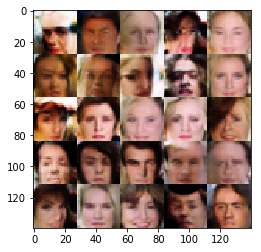

Epoch 2/2... iteration 2110... Discriminator Loss: 1.3360... Generator Loss: 1.0079
Epoch 2/2... iteration 2120... Discriminator Loss: 1.3549... Generator Loss: 1.1438
Epoch 2/2... iteration 2130... Discriminator Loss: 1.3626... Generator Loss: 1.2428
Epoch 2/2... iteration 2140... Discriminator Loss: 1.3154... Generator Loss: 1.0854
Epoch 2/2... iteration 2150... Discriminator Loss: 1.3595... Generator Loss: 1.2839
Epoch 2/2... iteration 2160... Discriminator Loss: 1.2114... Generator Loss: 1.4212
Epoch 2/2... iteration 2170... Discriminator Loss: 1.2531... Generator Loss: 1.5285
Epoch 2/2... iteration 2180... Discriminator Loss: 1.6082... Generator Loss: 1.6663
Epoch 2/2... iteration 2190... Discriminator Loss: 1.4505... Generator Loss: 1.3525
Epoch 2/2... iteration 2200... Discriminator Loss: 1.2936... Generator Loss: 1.2463


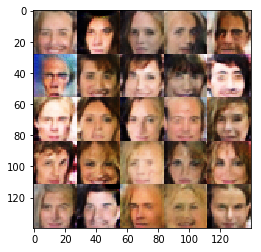

Epoch 2/2... iteration 2210... Discriminator Loss: 1.3050... Generator Loss: 1.1167
Epoch 2/2... iteration 2220... Discriminator Loss: 1.4369... Generator Loss: 1.3317
Epoch 2/2... iteration 2230... Discriminator Loss: 1.1434... Generator Loss: 1.8786
Epoch 2/2... iteration 2240... Discriminator Loss: 0.9144... Generator Loss: 1.8436
Epoch 2/2... iteration 2250... Discriminator Loss: 1.2159... Generator Loss: 1.2660
Epoch 2/2... iteration 2260... Discriminator Loss: 1.4577... Generator Loss: 1.3932
Epoch 2/2... iteration 2270... Discriminator Loss: 1.2885... Generator Loss: 1.2741
Epoch 2/2... iteration 2280... Discriminator Loss: 1.4318... Generator Loss: 1.3589
Epoch 2/2... iteration 2290... Discriminator Loss: 1.3172... Generator Loss: 1.4742
Epoch 2/2... iteration 2300... Discriminator Loss: 1.5415... Generator Loss: 0.9220


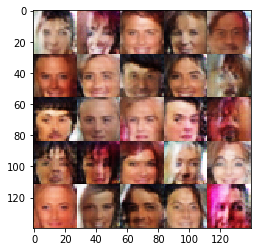

Epoch 2/2... iteration 2310... Discriminator Loss: 1.9190... Generator Loss: 2.5603
Epoch 2/2... iteration 2320... Discriminator Loss: 1.3878... Generator Loss: 1.1794
Epoch 2/2... iteration 2330... Discriminator Loss: 1.6373... Generator Loss: 1.5387
Epoch 2/2... iteration 2340... Discriminator Loss: 1.2989... Generator Loss: 1.2235
Epoch 2/2... iteration 2350... Discriminator Loss: 1.3043... Generator Loss: 1.2085
Epoch 2/2... iteration 2360... Discriminator Loss: 1.2381... Generator Loss: 1.3562
Epoch 2/2... iteration 2370... Discriminator Loss: 1.1647... Generator Loss: 1.0712
Epoch 2/2... iteration 2380... Discriminator Loss: 1.2737... Generator Loss: 2.0810
Epoch 2/2... iteration 2390... Discriminator Loss: 1.4959... Generator Loss: 1.3297
Epoch 2/2... iteration 2400... Discriminator Loss: 1.2796... Generator Loss: 1.2850


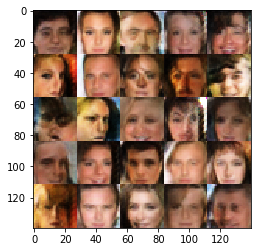

Epoch 2/2... iteration 2410... Discriminator Loss: 1.3222... Generator Loss: 1.4293
Epoch 2/2... iteration 2420... Discriminator Loss: 1.3302... Generator Loss: 1.1901
Epoch 2/2... iteration 2430... Discriminator Loss: 1.3663... Generator Loss: 1.2867
Epoch 2/2... iteration 2440... Discriminator Loss: 1.1159... Generator Loss: 1.4256
Epoch 2/2... iteration 2450... Discriminator Loss: 1.4316... Generator Loss: 1.2588
Epoch 2/2... iteration 2460... Discriminator Loss: 1.3148... Generator Loss: 1.5046
Epoch 2/2... iteration 2470... Discriminator Loss: 1.1753... Generator Loss: 1.2698
Epoch 2/2... iteration 2480... Discriminator Loss: 1.2255... Generator Loss: 1.1917
Epoch 2/2... iteration 2490... Discriminator Loss: 1.2123... Generator Loss: 1.6254
Epoch 2/2... iteration 2500... Discriminator Loss: 1.4265... Generator Loss: 1.5302


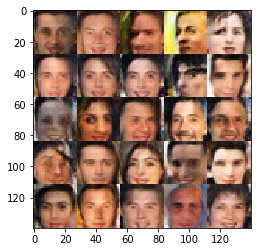

Epoch 2/2... iteration 2510... Discriminator Loss: 1.2249... Generator Loss: 2.1508
Epoch 2/2... iteration 2520... Discriminator Loss: 1.5340... Generator Loss: 1.2431
Epoch 2/2... iteration 2530... Discriminator Loss: 1.4335... Generator Loss: 1.0253
Epoch 2/2... iteration 2540... Discriminator Loss: 1.3627... Generator Loss: 1.0625
Epoch 2/2... iteration 2550... Discriminator Loss: 1.9145... Generator Loss: 1.2051
Epoch 2/2... iteration 2560... Discriminator Loss: 1.5023... Generator Loss: 1.0746
Epoch 2/2... iteration 2570... Discriminator Loss: 1.4292... Generator Loss: 1.1958
Epoch 2/2... iteration 2580... Discriminator Loss: 1.4293... Generator Loss: 1.3310
Epoch 2/2... iteration 2590... Discriminator Loss: 1.1842... Generator Loss: 1.2925
Epoch 2/2... iteration 2600... Discriminator Loss: 1.3844... Generator Loss: 1.2288


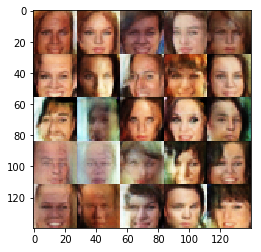

Epoch 2/2... iteration 2610... Discriminator Loss: 1.3464... Generator Loss: 1.4408
Epoch 2/2... iteration 2620... Discriminator Loss: 1.4176... Generator Loss: 1.3351
Epoch 2/2... iteration 2630... Discriminator Loss: 1.2509... Generator Loss: 1.3385
Epoch 2/2... iteration 2640... Discriminator Loss: 1.5455... Generator Loss: 0.9329
Epoch 2/2... iteration 2650... Discriminator Loss: 1.2875... Generator Loss: 1.1774
Epoch 2/2... iteration 2660... Discriminator Loss: 1.4518... Generator Loss: 1.4271
Epoch 2/2... iteration 2670... Discriminator Loss: 1.4417... Generator Loss: 1.1653
Epoch 2/2... iteration 2680... Discriminator Loss: 1.2786... Generator Loss: 1.3204
Epoch 2/2... iteration 2690... Discriminator Loss: 1.3842... Generator Loss: 1.1686
Epoch 2/2... iteration 2700... Discriminator Loss: 1.3904... Generator Loss: 1.1377


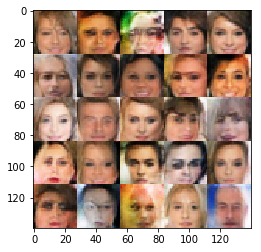

Epoch 2/2... iteration 2710... Discriminator Loss: 1.4018... Generator Loss: 1.0784
Epoch 2/2... iteration 2720... Discriminator Loss: 1.2898... Generator Loss: 1.2605
Epoch 2/2... iteration 2730... Discriminator Loss: 1.3079... Generator Loss: 1.1814
Epoch 2/2... iteration 2740... Discriminator Loss: 1.4315... Generator Loss: 1.2342
Epoch 2/2... iteration 2750... Discriminator Loss: 1.3884... Generator Loss: 1.1232
Epoch 2/2... iteration 2760... Discriminator Loss: 1.3274... Generator Loss: 1.5088
Epoch 2/2... iteration 2770... Discriminator Loss: 1.3346... Generator Loss: 1.3882
Epoch 2/2... iteration 2780... Discriminator Loss: 1.3833... Generator Loss: 1.5131
Epoch 2/2... iteration 2790... Discriminator Loss: 1.3509... Generator Loss: 1.1406
Epoch 2/2... iteration 2800... Discriminator Loss: 1.3421... Generator Loss: 1.0920


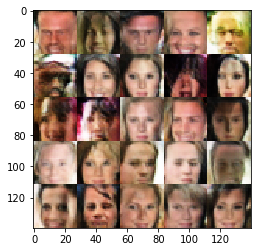

Epoch 2/2... iteration 2810... Discriminator Loss: 1.4195... Generator Loss: 2.1395
Epoch 2/2... iteration 2820... Discriminator Loss: 1.4669... Generator Loss: 1.8048
Epoch 2/2... iteration 2830... Discriminator Loss: 1.2728... Generator Loss: 1.2594
Epoch 2/2... iteration 2840... Discriminator Loss: 1.2464... Generator Loss: 1.2213
Epoch 2/2... iteration 2850... Discriminator Loss: 1.3959... Generator Loss: 1.2254
Epoch 2/2... iteration 2860... Discriminator Loss: 1.4328... Generator Loss: 1.3801
Epoch 2/2... iteration 2870... Discriminator Loss: 1.3864... Generator Loss: 1.2018
Epoch 2/2... iteration 2880... Discriminator Loss: 1.3039... Generator Loss: 1.0659
Epoch 2/2... iteration 2890... Discriminator Loss: 1.4814... Generator Loss: 1.4633
Epoch 2/2... iteration 2900... Discriminator Loss: 1.3630... Generator Loss: 1.1645


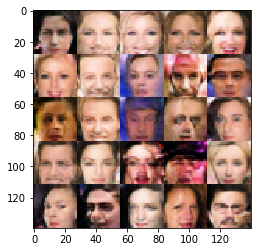

Epoch 2/2... iteration 2910... Discriminator Loss: 1.2904... Generator Loss: 1.2649
Epoch 2/2... iteration 2920... Discriminator Loss: 1.4821... Generator Loss: 1.1678
Epoch 2/2... iteration 2930... Discriminator Loss: 1.3856... Generator Loss: 1.0217
Epoch 2/2... iteration 2940... Discriminator Loss: 1.3259... Generator Loss: 0.9578
Epoch 2/2... iteration 2950... Discriminator Loss: 1.3344... Generator Loss: 1.1642
Epoch 2/2... iteration 2960... Discriminator Loss: 1.3298... Generator Loss: 1.0606
Epoch 2/2... iteration 2970... Discriminator Loss: 1.4848... Generator Loss: 0.8223
Epoch 2/2... iteration 2980... Discriminator Loss: 1.4428... Generator Loss: 1.2405
Epoch 2/2... iteration 2990... Discriminator Loss: 1.3886... Generator Loss: 1.0661
Epoch 2/2... iteration 3000... Discriminator Loss: 1.4013... Generator Loss: 0.9031


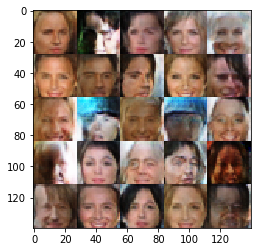

Epoch 2/2... iteration 3010... Discriminator Loss: 1.3395... Generator Loss: 1.1435
Epoch 2/2... iteration 3020... Discriminator Loss: 1.3700... Generator Loss: 1.0857
Epoch 2/2... iteration 3030... Discriminator Loss: 1.2915... Generator Loss: 1.0932
Epoch 2/2... iteration 3040... Discriminator Loss: 1.2607... Generator Loss: 1.3294
Epoch 2/2... iteration 3050... Discriminator Loss: 1.3270... Generator Loss: 1.1389
Epoch 2/2... iteration 3060... Discriminator Loss: 1.3735... Generator Loss: 1.2667
Epoch 2/2... iteration 3070... Discriminator Loss: 1.3726... Generator Loss: 1.2618
Epoch 2/2... iteration 3080... Discriminator Loss: 1.6329... Generator Loss: 1.5628
Epoch 2/2... iteration 3090... Discriminator Loss: 1.3662... Generator Loss: 1.3343
Epoch 2/2... iteration 3100... Discriminator Loss: 1.2494... Generator Loss: 1.1540


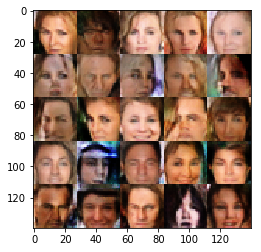

Epoch 2/2... iteration 3110... Discriminator Loss: 1.2645... Generator Loss: 1.2714
Epoch 2/2... iteration 3120... Discriminator Loss: 1.3032... Generator Loss: 1.3431
Epoch 2/2... iteration 3130... Discriminator Loss: 1.3224... Generator Loss: 1.0969
Epoch 2/2... iteration 3140... Discriminator Loss: 1.4064... Generator Loss: 1.3375
Epoch 2/2... iteration 3150... Discriminator Loss: 1.5186... Generator Loss: 1.0563
Epoch 2/2... iteration 3160... Discriminator Loss: 1.5641... Generator Loss: 0.7864


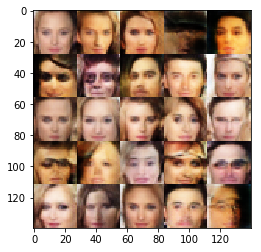

In [20]:
#With drop-out 

batch_size = 64
z_dim = 200
learning_rate = 0.0005
beta1 = 0.3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.